「AI創薬・ケモインフォマティクス」第6回「計算機実験2」講義資料4　（講師：小寺正明）

2月19日(金)19:40～21:10

In [ ]:
!date

Thu Feb 18 06:27:11 UTC 2021


# 必要なツールのインストール

In [ ]:
# RDKit installer のインストール
!pip install git+https://github.com/maskot1977/rdkit_installer.git

# RDKitのインストール
from rdkit_installer import install
install.from_miniconda()

# Optuna のインストール
!pip install optuna

# ScikitAllStars のインストール
!pip install git+https://github.com/maskot1977/scikitallstars.git

# SHAP のインストール
# !pip install shap  # 今回は使わない

# UMAP のインストール
!pip3 install umap-learn

# mordredのインストール
!pip install mordred

  Cloning https://github.com/maskot1977/rdkit_installer.git to /tmp/pip-req-build-xeep93b_
  Running command git clone -q https://github.com/maskot1977/rdkit_installer.git /tmp/pip-req-build-xeep93b_
  Created wheel for rdkit-installer: filename=rdkit_installer-0.1.0-cp36-none-any.whl size=4522 sha256=7ad9cd0e324b396a0755a6f4fb0680a24cedb84398dc687c88b2cdd72d1758d3
  Stored in directory: /tmp/pip-ephem-wheel-cache-3aiu_nj7/wheels/22/35/68/f3dcba76a2c9080c925b783ddf87a69f63521e0378721aec73
Successfully built rdkit-installer


add /root/miniconda/lib/python3.6/site-packages to PYTHONPATH
python version: 3.6.9
fetching installer from https://repo.continuum.io/miniconda/Miniconda3-4.7.12-Linux-x86_64.sh
done
installing miniconda to /root/miniconda
done
installing rdkit
done
rdkit-2020.03.3 installation finished!


     |████████████████████████████████| 296kB 4.1MB/s 
     |████████████████████████████████| 81kB 4.2MB/s 
     |████████████████████████████████| 1.1MB 7.0MB/s 
     |████████████████████████████████| 51kB 5.3MB/s 
     |████████████████████████████████| 112kB 16.8MB/s 
     |████████████████████████████████| 143kB 13.0MB/s 
     |████████████████████████████████| 481kB 13.2MB/s 
  Created wheel for alembic: filename=alembic-1.5.4-py2.py3-none-any.whl size=156314 sha256=b089b352c779e76bd3c343e36bcb2cafad19d7148c89fd0f3a1e72f65bc08a9b
  Stored in directory: /root/.cache/pip/wheels/fd/2d/ec/5a1b1e2363ed68392d292d215facf588d5448198edd8078bc1
  Created wheel for Mako: filename=Mako-1.1.4-py2.py3-none-any.whl size=75675 sha256=617bd2a03fe1be354b2c034a0a903b253142e5d8917d1886bd71fc992bd472c0
  Stored in directory: /root/.cache/pip/wheels/ad/10/d3/aeb26e20d19045e2a68e5d3cbb57432e11b5d9c92c99f98d47
  Created wheel for pyperclip: filename=pyperclip-1.8.1-cp36-none-any.whl size=11120 sha256=b

In [ ]:
!date

Thu Feb 18 06:28:43 UTC 2021


# 化合物データのダウンロード

In [ ]:
import urllib.request

# 化合物データのダウンロード
url = "https://raw.githubusercontent.com/maskot1977/tmd2020/main/data/data_1.csv"
urllib.request.urlretrieve(url, url.split("/")[-1])

('data_1.csv', <http.client.HTTPMessage at 0x7f4f8baa2ef0>)

In [ ]:
import pandas as pd

# csvからのデータ読み込み
df = pd.read_csv('data_1.csv')
df

,PCCDB-ID,Open Babel SMILES,HOMO-LUMO gap,HOMO energy,LUMO energy,Dipole moment,Excitation energy (1st),Oscillator strength (1st),Excitation energy (2nd),Oscillator strength (2nd),Excitation energy (3rd),Oscillator strength (3rd),Excitation energy (4th),Oscillator strength (4th),Num. of H bond acceptor,Num. of H bond donor,TPSA,logP,Molecular refractivity,Melting point
0,15493,CN(CCCN1C(=CC(=C[C@@H](C1=O)C)C)C)C,5.064,-5.440,-0.376,3.07,4.378,0.1218,4.792,0.0021,4.912,0.0125,5.056,NaN,3.0,0.0,23.55,2.204,76.26,43.79
1,20139,OCc1c(C)cc(cc1C)C,6.041,-6.212,-0.171,1.69,4.995,0.0059,5.425,0.1014,5.859,0.0070,5.924,NaN,1.0,1.0,20.23,2.104,47.47,40.29
2,7039,OCc1cc(C)cc(c1O)CO,5.576,-5.742,-0.166,4.50,4.556,0.0443,5.059,0.0047,5.419,0.0096,5.583,NaN,3.0,3.0,60.69,0.685,45.69,95.04
3,18597,Oc1ccc(c(c1)C)C(C)C,5.837,-5.687,0.150,1.18,4.910,0.0316,5.027,0.0001,5.475,0.0037,5.608,NaN,1.0,1.0,20.23,2.824,48.01,51.64
4,23204,C/C/1=C\CC(C)(C)/C=C/C/C(=C\CC1)/C,6.229,-5.782,0.446,0.12,5.263,0.0250,5.411,0.0053,5.557,0.0087,5.641,NaN,0.0,0.0,0.00,5.035,70.42,44.94
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
628,12787,Oc1cc(O)c(c(c1O)C)O,5.124,-4.797,0.327,0.40,3.932,0.0000,4.237,0.0000,4.453,0.0512,4.457,NaN,4.0,4.0,80.92,0.817,39.50,171.05
629,3840,OCc1occ(c(=O)c1)O,5.154,-6.376,-1.222,3.31,3.880,0.0000,4.801,0.1048,5.141,0.0003,5.335,NaN,4.0,2.0,70.67,-0.162,33.13,101.42
630,675,Cc1cc2[nH]cnc2cc1C,5.625,-5.802,-0.177,3.34,4.834,0.0820,5.129,0.0907,5.167,0.0013,5.260,NaN,1.0,1.0,28.68,2.180,46.03,120.11
631,18598,CC(c1cccc(c1O)C)C,5.984,-5.755,0.229,1.67,5.030,0.0381,5.059,0.0018,5.625,0.0029,5.670,NaN,1.0,1.0,20.23,2.824,48.01,51.64


In [ ]:
!date

Thu Feb 18 06:28:43 UTC 2021


# RDKit descriptors の計算

In [ ]:
from rdkit_installer.descriptors import calc_descriptors

rdkit_descriptors_df = calc_descriptors(df['Open Babel SMILES'])
rdkit_descriptors_df

,MaxEStateIndex,MinEStateIndex,MaxAbsEStateIndex,MinAbsEStateIndex,qed,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,NumRadicalElectrons,MaxPartialCharge,MinPartialCharge,MaxAbsPartialCharge,MinAbsPartialCharge,FpDensityMorgan1,FpDensityMorgan2,FpDensityMorgan3,BalabanJ,BertzCT,Chi0,Chi0n,Chi0v,Chi1,Chi1n,Chi1v,Chi2n,Chi2v,Chi3n,Chi3v,Chi4n,Chi4v,HallKierAlpha,Ipc,Kappa1,Kappa2,Kappa3,LabuteASA,PEOE_VSA1,PEOE_VSA10,PEOE_VSA11,...,fr_hdrzine,fr_hdrzone,fr_imidazole,fr_imide,fr_isocyan,fr_isothiocyan,fr_ketone,fr_ketone_Topliss,fr_lactam,fr_lactone,fr_methoxy,fr_morpholine,fr_nitrile,fr_nitro,fr_nitro_arom,fr_nitro_arom_nonortho,fr_nitroso,fr_oxazole,fr_oxime,fr_para_hydroxylation,fr_phenol,fr_phenol_noOrthoHbond,fr_phos_acid,fr_phos_ester,fr_piperdine,fr_piperzine,fr_priamide,fr_prisulfonamd,fr_pyridine,fr_quatN,fr_sulfide,fr_sulfonamd,fr_sulfone,fr_term_acetylene,fr_tetrazole,fr_thiazole,fr_thiocyan,fr_thiophene,fr_unbrch_alkane,fr_urea
0,12.203893,-0.011059,12.203893,0.011059,0.747310,236.359,212.167,236.188863,96,0,0.232872,-0.315939,0.315939,0.232872,1.352941,2.000000,2.588235,2.692946,342.131373,12.999636,11.656047,11.656047,7.913591,6.243605,6.243605,5.131783,5.131783,3.017810,3.017810,2.172367,2.172367,-1.09,4386.307253,13.972854,6.009622,4.004817,104.779651,9.799819,0.000000,0.000000,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,8.990151,0.150741,8.990151,0.150741,0.649670,150.221,136.109,150.104465,60,0,0.068649,-0.391660,0.391660,0.068649,1.090909,1.545455,1.909091,3.247713,240.570442,8.430721,7.309021,7.309021,5.147066,3.824482,3.824482,3.035385,3.035385,1.998483,1.998483,1.459315,1.459315,-0.82,255.676668,8.278232,3.054899,1.603412,67.685405,5.106527,0.000000,0.000000,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,9.393241,-0.207824,9.393241,0.008704,0.608365,168.192,156.096,168.078644,66,0,0.126112,-0.507200,0.507200,0.126112,1.083333,1.500000,1.833333,3.219755,256.097291,9.137828,6.910555,6.910555,5.685071,3.717870,3.717870,2.748003,2.748003,1.752819,1.752819,1.175315,1.175315,-1.06,499.168482,9.031408,3.559264,1.571153,70.908931,15.319582,5.749512,0.000000,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,9.119284,0.353611,9.119284,0.353611,0.652274,150.221,136.109,150.104465,60,0,0.115360,-0.507956,0.507956,0.115360,1.272727,1.909091,2.363636,3.092720,251.049732,8.430721,7.256615,7.256615,5.109061,3.905016,3.905016,3.195591,3.195591,1.875392,1.875392,1.307668,1.307668,-0.98,252.107381,8.119800,2.951612,1.732031,67.685405,5.106527,5.749512,0.000000,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,2.401620,0.311389,2.401620,0.311389,0.485103,204.357,180.165,204.187801,84,0,-0.014017,-0.084980,0.084980,0.014017,1.066667,1.800000,2.533333,2.790626,287.160171,11.311555,10.637828,10.637828,6.994800,5.984764,5.984764,5.438827,5.438827,3.016960,3.016960,1.800810,1.800810,-0.78,1710.416432,12.290323,5.344008,5.013262,94.773800,0.000000,0.000000,0.000000,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
628,8.990463,-0.446481,8.990463,0.057870,0.330838,156.137,148.073,156.042259,60,0,0.163917,-0.504157,0.504157,0.163917,0.909091,1.272727,1.636364,3.455546,266.732315,8.593858,5.866205,5.866205,5.036581,2.971777,2.971777,2.237032,2.237032,1.469088,1.469088,0.762583,0.762583,-1.58,256.346785,7.526157,2.229407,1.022829,62.973280,20.426110,0.000000,22.998047,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4,4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
629,10.577593,-0.546019,10.577593,0.141481,0.571034,142.110,136.062,142.02660

# Mordred descriptors の計算

In [ ]:
from rdkit import Chem
from mordred import Calculator, descriptors

calc = Calculator(descriptors)
mordred_descriptors_df = calc.pandas([Chem.MolFromSmiles(smile) for smile in df['Open Babel SMILES']])
mordred_descriptors_df

100%|██████████| 633/633 [02:52<00:00,  3.68it/s]


,ABC,ABCGG,nAcid,nBase,SpAbs_A,SpMax_A,SpDiam_A,SpAD_A,SpMAD_A,LogEE_A,VE1_A,VE2_A,VE3_A,VR1_A,VR2_A,VR3_A,nAromAtom,nAromBond,nAtom,nHeavyAtom,nSpiro,nBridgehead,nHetero,nH,nB,nC,nN,nO,nS,nP,nF,nCl,nBr,nI,nX,ATS0dv,ATS1dv,ATS2dv,ATS3dv,ATS4dv,...,JGI7,JGI8,JGI9,JGI10,JGT10,Diameter,Radius,TopoShapeIndex,PetitjeanIndex,Vabc,VAdjMat,MWC01,MWC02,MWC03,MWC04,MWC05,MWC06,MWC07,MWC08,MWC09,MWC10,TMWC10,SRW02,SRW03,SRW04,SRW05,SRW06,SRW07,SRW08,SRW09,SRW10,TSRW10,MW,AMW,WPath,WPol,Zagreb1,Zagreb2,mZagreb1,mZagreb2
0,12.555834,11.602561,0,1,19.854843,2.352277,4.611329,19.854843,1.167932,3.715164,3.514302,0.206724,1.787469,129.529290,7.619370,5.394535,0,0,41,17,0,0,3,24,0,14,2,1,0,0,0,0,0,0,0,178.0,170.0,209.0,234.0,159.0,...,0.013021,0.015983,0.0,0.0,0.555706,9,5,0.800000,0.444444,261.218164,5.087463,17.0,4.394449,5.187386,6.037871,6.855409,7.711101,8.541495,9.398892,10.237278,11.095120,103.459001,3.555348,0.0,4.844187,0.000000,6.289716,2.70805,7.812378,5.379897,9.381348,56.970925,236.188863,5.760704,533,26,80.0,89.0,7.916667,3.833333
1,8.025464,7.826624,0,0,12.698196,2.326846,4.653693,12.698196,1.154381,3.295059,3.073114,0.279374,1.218002,37.827512,3.438865,3.728347,6,6,25,11,0,0,1,14,0,10,0,1,0,0,0,0,0,0,0,114.0,110.0,137.0,120.0,61.0,...,0.000000,0.000000,0.0,0.0,0.570105,6,3,1.000000,0.500000,159.140702,4.459432,11.0,3.970292,4.779123,5.638355,6.459904,7.323171,8.147578,9.011279,9.836439,10.700071,87.866213,3.135494,0.0,4.418841,0.000000,5.916202,0.00000,7.519150,0.000000,9.169831,41.159518,150.104465,6.004179,146,15,52.0,59.0,5.194444,2.555556
2,8.623181,8.454283,0,0,14.828323,2.340374,4.680749,14.828323,1.235694,3.376509,3.161639,0.263470,1.333412,45.534706,3.794559,4.000796,6,6,24,12,0,0,3,12,0,9,0,3,0,0,0,0,0,0,0,166.0,140.0,195.0,200.0,174.0,...,0.000000,0.000000,0.0,0.0,0.511503,6,4,0.500000,0.333333,159.425171,4.584963,12.0,4.043051,4.859812,5.713733,6.552508,7.407924,8.252446,9.106867,9.953277,10.806956,90.696575,3.218876,0.0,4.488636,0.000000,5.983936,0.00000,7.585281,0.000000,9.238442,42.515171,168.078644,7.003277,188,17,56.0,64.0,5.444444,2.888889
3,8.134854,7.770338,0,0,12.675204,2.302776,4.605551,12.675204,1.152291,3.294669,3.091013,0.281001,1.223809,37.212677,3.382971,3.711960,6,6,25,11,0,0,1,14,0,10,0,1,0,0,0,0,0,0,0,112.0,115.0,140.0,114.0,54.0,...,0.000000,0.000000,0.0,0.0,0.580361,6,3,1.000000,0.500000,159.140702,4.459432,11.0,3.970292,4.762174,5.609472,6.421622,7.271704,8.087948,8.938663,9.755741,10.606610,87.424225,3.135494,0.0,4.418841,0.000000,5.899897,0.00000,7.474772,0.000000,9.094144,41.023148,150.104465,6.004179,150,14,52.0,58.0,5.194444,2.472222
4,11.143219,9.394819,0,0,17.535313,2.233148,4.444177,17.535313,1.169021,3.590952,3.540074,0.236005,1.669613,66.874116,4.458274,4.608277,0,0,39,15,0,0,0,24,0,15,0,0,0,0,0,0,0,0,0,104.0,107.0,111.0,115.0,121.0,...,0.000000,0.000000,0.0,0.0,0.517928,6,5,0.200000,0.166667,247.730402,4.906891,15.0,4.262680,5.003946,5.831882,6.591674,7.418781,8.185629,9.011767,9.782844,10.608094,96.697298,3.433987,0.0,4.709530,0.000000,6.124683,0.00000,7.596392,0.000000,9.098403,45.962996,204.187801,5.235585,359,19,70.0,74.0,6.284722,3.333333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
628,8.163363,8.029752,0,0,13.137460,2.364871,4.729742,13.137460,1.194315,3.303305,3.092493,0.281136,1.224288,35.727761,3.247978,3.671238,6,6,19,11,0,0,4,8,0,7,0,4,0,0,0,0,0,0,0,190.0,172.0,246.0,262.0,143.0,...,0.000000,0.000000,0.0,0.0,0.560975,5,3,0.666667,0.400000,133.623428,4.459432,11.0,4.007333,4.844187,5.707110,6.561031,7.424762,8.281724,9.145375,10.003107,10.866605,88.841233,3.135494,0.0,4.465908,0.000000,6.008813,0.00000,7.647309,0.000000,9.331052,41.588577,156.042259,8.212750,140,17,54.0,63.0,5.805556,2.444444
629,

# 各種 Fingerprint の計算

In [ ]:
from rdkit_installer.fingerprints import Fingerprinter

fingerprinter = Fingerprinter()
fingerprinter.names()

['MACCSkeys',
 'Avalon',
 'Morgan2(1024bits)',
 'Morgan2F(1024bits)',
 'Morgan4(2048bits)',
 'Morgan4F(2048bits)',
 'ECFP2',
 'FCFP2',
 'ECFP4',
 'FCFP4',
 'ECFP6',
 'FCFP6']

In [ ]:
fp_type = "MACCSkeys"
matrix = []
for vec in fingerprinter.transform(df['Open Babel SMILES'][:10], fp_type=fp_type):
    matrix.append(vec)

pd.DataFrame(matrix)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0,1,1,0,0,1,1,1,0,0,0,1,1,1,1,0,0,1,1,1,1,0,1,0,1,1,0,0,1,1,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,1,0,0,0,0,1,1,0,0,1,0,1,0,1,0,0,1,0,1,1,1,1,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,1,1,0,0,1,0,0,0,0,0,0,1,1,0,0,0,1,1,0,1,0,0,0,1,0,1,1,0,1,0,1,0,1,1,0,1,1,1,1,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,0,1,1,0,0,0,0,1,1,0,1,0,0,0,0,1,0,0,1,0,1,1,1,1,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0
5,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,0,1,0,1,1,1,1,1,0,1,0,1,1,1,1,1,1,1,1,1,0
6,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0,0,0,0,1,1,1,0,0,1,0,1,1,0,1,1,1,1,0
7,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,1,1,0,0,0,1,1,0,1,1,0,0,1,0,0,1,0,0,0,1,0,1,1,1,1,0,1,0,1,0,0,0,0,1,1,0
8,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,1,1,0,0,0,0,1,0,0,0,0,1,1,1,1,0,1,0
9,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,...,1,0,0,0,1,0,0,0,0,0,1,0,1,0,0,1,1,1,0,0,1,1,0,1,1,0,1,1,1,1,1,1,1,1,1,1,1,1,1,0


In [ ]:
fp_type = "ECFP2"
matrix = []
for vec in fingerprinter.transform(df['Open Babel SMILES'][:10], fp_type=fp_type):
    matrix.append(vec)

pd.DataFrame(matrix, columns=fingerprinter.all_bit_info_keys[fp_type])

,2076190208,2245273601,3925172229,2246728737,2976816164,1909452861,98513984,3921298496,26234434,3118255683,4197146180,3346582092,2245384272,994494548,548743766,2132511834,4256629345,2070178920,3581739114,2257970297,1275679867,4250103431,864942730,3818546315,3121777292,3189457552,847957139,864674487,422715066,3176806076,584893129,3025629386,1276993226,951226070,3624155,1535166686,1542633699,758494440,2905660137,3491109101,...,3346539298,3542456614,864662311,2297887526,787341104,10565946,1101907775,3162837314,3662562115,2849741637,4089138501,3975275337,3776905034,3983062349,3218693969,215642972,2245541727,3982076256,3217380708,994485099,3124581743,848128881,1510461303,2041434490,3206633359,2446961558,2968968094,603510687,2092489639,1100037548,1078211001,3368912827,1630260676,3081284555,2592785365,4022716898,251572710,4086265842,2976033787,3777168895
0,0,0,1,5,0,0,0,0,0,0,0,1,3,1,0,0,0,0,0,1,0,1,1,2,1,0,0,0,2,0,0,0,0,0,0,0,0,1,0,0,...,0,0,0,0,0,1,0,0,0,0,0,0,0,0,2,0,0,0,3,0,0,1,1,0,1,1,0,1,1,0,0,0,0,0,0,0,0,0,1,0
1,0,0,0,3,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,1,0,0,0,0,...,0,0,1,0,0,0,0,0,0,1,0,0,0,0,2,0,0,0,4,2,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
2,0,0,0,1,0,0,0,0,1,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,2,0,0,0,0,...,0,0,3,0,0,0,0,0,0,2,2,0,0,0,2,0,0,0,4,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,1,0,3,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,2,0,0,0,0,1,1,...,0,0,1,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,3,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,4,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,2,0,0,0,1,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,4,0,0,0,2,0,0,0,0,0,0,0,4,0,0,0,0,2,0,0,0,0,0,0,0,0
5,1,0,0,2,0,0,0,0,0,0,1,0,2,0,0,0,0,0,0,0,0,0,0,0,0,1,1,1,1,0,0,0,0,2,1,0,0,0,0,0,...,0,0,0,0,1,0,0,1,1,0,0,1,0,1,3,0,0,0,5,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0
6,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,1,0,0,1,0,0,0,0,2,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0,0,0,0,0,3,0,0,1,4,0,1,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0
7,0,1,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,3,0,0,1,0,0,0,0,0,0,0,0,0,1,1,0,0,0,...,0,0,2,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,3,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,1,1,0,1,0
8,0,0,0,2,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0,1,0,1,0,3,0,0,0,2,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
9,0,0,0,1,0,0,0,0,1,0,0,0,2,0,0,1,0,0,1,1,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,...,1,1,1,1,0,1,1,0,0,0,0,0,0,0,1,1,1,0,4,0,0,0,0,2,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0


In [ ]:
fp_dfs = []
for name in fingerprinter.names():
    fp_df = pd.DataFrame([vec for vec in fingerprinter.transform(df['Open Babel SMILES'], fp_type=name)])
    if name in fingerprinter.all_bit_info_keys.keys():
        fp_df.columns=fingerprinter.all_bit_info_keys[name]

    print(name, fp_df.shape)
    fp_dfs.append(fp_df)

MACCSkeys (633, 167)
Avalon (633, 512)
Morgan2(1024bits) (633, 1024)
Morgan2F(1024bits) (633, 1024)
Morgan4(2048bits) (633, 2048)
Morgan4F(2048bits) (633, 2048)
ECFP2 (633, 693)
FCFP2 (633, 207)
ECFP4 (633, 3128)
FCFP4 (633, 1450)
ECFP6 (633, 6508)
FCFP6 (633, 4110)


In [ ]:
!date

Thu Feb 18 06:31:56 UTC 2021


# 前処理としての特徴選択と正規化

In [ ]:
from sklearn.feature_selection import VarianceThreshold

sel = VarianceThreshold() # Removing features with low variance

fp_dfs = []
for name in fingerprinter.names():
    fp_df = pd.DataFrame([vec for vec in fingerprinter.transform(df['Open Babel SMILES'], fp_type=name)])
    fp_df = pd.DataFrame(sel.fit_transform(fp_df)).apply(lambda x: (x-x.mean())/x.std(), axis=0)
    if name in fingerprinter.all_bit_info_keys.keys():
        fp_df.columns=fingerprinter.all_bit_info_keys[name]
        
    print(name, fp_df.shape)
    fp_dfs.append(fp_df)

MACCSkeys (633, 133)
Avalon (633, 511)
Morgan2(1024bits) (633, 970)
Morgan2F(1024bits) (633, 768)
Morgan4(2048bits) (633, 2002)
Morgan4F(2048bits) (633, 1912)
ECFP2 (633, 693)
FCFP2 (633, 207)
ECFP4 (633, 3128)
FCFP4 (633, 1450)
ECFP6 (633, 6508)
FCFP6 (633, 4110)


In [ ]:
from sklearn.feature_selection import VarianceThreshold

sel = VarianceThreshold() # Removing features with low variance
rdkit_descriptors_df2 = pd.DataFrame(
    sel.fit_transform(rdkit_descriptors_df), 
    columns=[rdkit_descriptors_df.columns[i] for i, var in enumerate(sel.variances_) if var != 0]
    ).apply(lambda x: (x-x.mean())/x.std(), axis=0)
rdkit_descriptors_df2

,MaxEStateIndex,MinEStateIndex,MaxAbsEStateIndex,MinAbsEStateIndex,qed,MolWt,HeavyAtomMolWt,ExactMolWt,NumValenceElectrons,NumRadicalElectrons,MaxPartialCharge,MinPartialCharge,MaxAbsPartialCharge,MinAbsPartialCharge,FpDensityMorgan1,FpDensityMorgan2,FpDensityMorgan3,BalabanJ,BertzCT,Chi0,Chi0n,Chi0v,Chi1,Chi1n,Chi1v,Chi2n,Chi2v,Chi3n,Chi3v,Chi4n,Chi4v,HallKierAlpha,Ipc,Kappa1,Kappa2,Kappa3,LabuteASA,PEOE_VSA1,PEOE_VSA10,PEOE_VSA11,...,fr_allylic_oxid,fr_amide,fr_amidine,fr_aniline,fr_aryl_methyl,fr_azo,fr_barbitur,fr_benzene,fr_bicyclic,fr_ester,fr_ether,fr_furan,fr_guanido,fr_hdrzine,fr_imidazole,fr_imide,fr_ketone,fr_ketone_Topliss,fr_lactam,fr_lactone,fr_methoxy,fr_nitrile,fr_nitro,fr_nitro_arom,fr_nitro_arom_nonortho,fr_nitroso,fr_oxazole,fr_oxime,fr_para_hydroxylation,fr_phenol,fr_phenol_noOrthoHbond,fr_phos_acid,fr_phos_ester,fr_priamide,fr_pyridine,fr_sulfide,fr_thiazole,fr_thiophene,fr_unbrch_alkane,fr_urea
0,1.274376,-0.158629,1.274376,-1.085089,1.133433,1.399290,1.174363,1.399156,1.692703,-0.320779,0.353761,0.467031,-0.482227,0.359665,0.594038,0.505161,0.585798,-0.641114,-0.021146,1.570414,2.105631,2.071591,1.284993,1.932425,1.826062,2.023675,1.930874,1.278815,1.165320,1.519753,1.366465,0.630884,0.695500,2.070365,2.020649,2.414391,1.643881,0.446379,-0.698957,-0.683758,...,3.935712,1.770557,-0.089158,-0.306832,-1.013262,-0.079682,-0.097746,-1.242504,-0.543448,-0.18271,-0.514767,-0.171831,-0.267224,-0.084118,-0.226746,-0.136792,-0.332673,-0.304432,-0.039746,-0.099781,-0.353755,-0.137965,-0.247191,-0.207471,-0.126594,-0.039746,-0.079682,-0.068952,-0.234740,-0.397647,-0.377041,-0.039746,-0.039746,-0.056254,-0.230987,-0.154215,-0.068952,-0.079682,-0.092107,-0.126594
1,0.280126,0.061761,0.280126,-0.731299,0.326667,-0.900940,-0.964628,-0.901133,-0.801692,-0.320779,-0.975822,-0.075287,0.062114,-1.088829,-0.520865,-0.837860,-0.953796,0.853821,-0.898601,-0.813282,-0.532945,-0.553707,-0.890652,-0.561592,-0.594498,-0.288966,-0.334385,-0.223303,-0.275789,0.149073,0.076332,1.250672,-0.688819,-0.570430,-0.489230,-0.334405,-0.778132,-0.349544,-0.698957,-0.683758,...,-0.263118,-0.202617,-0.089158,-0.306832,1.677905,-0.079682,-0.097746,0.569720,-0.543448,-0.18271,-0.514767,-0.171831,-0.267224,-0.084118,-0.226746,-0.136792,-0.332673,-0.304432,-0.039746,-0.099781,-0.353755,-0.137965,-0.247191,-0.207471,-0.126594,-0.039746,-0.079682,-0.068952,-0.234740,-0.397647,-0.377041,-0.039746,-0.039746,-0.056254,-0.230987,-0.154215,-0.068952,-0.079682,-0.092107,-0.126594
2,0.404832,-0.426646,0.404832,-1.091054,-0.014620,-0.421042,-0.402530,-0.420839,-0.385959,-0.320779,-0.510593,-0.902801,0.892714,-0.581992,-0.553099,-0.972162,-1.125535,0.778481,-0.764454,-0.444370,-0.774807,-0.794353,-0.467555,-0.671505,-0.701174,-0.605991,-0.644914,-0.585323,-0.623106,-0.396854,-0.437515,0.699750,-0.607217,-0.221156,-0.060798,-0.371331,-0.567657,1.382460,0.488940,-0.683758,...,-0.263118,-0.202617,-0.089158,-0.306832,-0.116206,-0.079682,-0.097746,0.569720,-0.543448,-0.18271,-0.514767,-0.171831,-0.267224,-0.084118,-0.226746,-0.136792,-0.332673,-0.304432,-0.039746,-0.099781,-0.353755,-0.137965,-0.247191,-0.207471,-0.126594,-0.039746,-0.079682,-0.068952,-0.234740,1.146589,-0.377041,-0.039746,-0.039746,-0.056254,-0.230987,-0.154215,-0.068952,-0.079682,-0.092107,-0.126594
3,0.320077,0.338094,0.320077,-0.217463,0.348185,-0.900940,-0.964628,-0.901133,-0.801692,-0.320779,-0.597639,-0.908214,0.898147,-0.676823,0.252741,0.236557,0.076641,0.436159,-0.808063,-0.813282,-0.564754,-0.585357,-0.920539,-0.478564,-0.513916,-0.112234,-0.161274,-0.404695,-0.449814,-0.142435,-0.198047,0.883390,-0.690016,-0.643900,-0.576966,-0.187180,-0.778132,-0.349544,0.488940,-0.683758,...,-0.263118,-0.202617,-0.089158,-0.306832,-0.116206,-0.079682,-0.097746,0.569720,-0.543448,-0.18271,-0.514767,-0.171831,-0.267224,-0.084118,-0.226746,-0.136792,-0.332673,-0.304432,-0.039746,-0.099781,-0.353755,-0.137965,-0.247191,-0.207471,-0.126594,-0.039746,-0.079682,-0.068952,-0.234740,1.146589,1.203536,-0.03974

In [ ]:
import numpy as np

ok_id = []
for colid, col in enumerate(mordred_descriptors_df.values.T):
    try:
        if np.var(col) != 0:
            ok_id.append(colid)
    except:
        pass

mordred_descriptors_df2 = mordred_descriptors_df.iloc[:, ok_id].apply(lambda x: (x-x.mean())/x.std(), axis=0)
mordred_descriptors_df2

,ABC,ABCGG,nAcid,nBase,SpAbs_A,SpMax_A,SpDiam_A,SpAD_A,SpMAD_A,LogEE_A,VE1_A,VE2_A,VE3_A,VR1_A,VR2_A,VR3_A,nAromAtom,nAromBond,nAtom,nHeavyAtom,nBridgehead,nHetero,nH,nC,nN,nO,nS,nP,ATS0dv,ATS1dv,ATS2dv,ATS3dv,ATS4dv,ATS5dv,ATS6dv,ATS7dv,ATS8dv,ATS0d,ATS1d,ATS2d,...,JGI6,JGI7,JGI8,JGI9,JGI10,JGT10,Diameter,Radius,TopoShapeIndex,PetitjeanIndex,Vabc,VAdjMat,MWC01,MWC02,MWC03,MWC04,MWC05,MWC06,MWC07,MWC08,MWC09,MWC10,TMWC10,SRW02,SRW04,SRW05,SRW06,SRW07,SRW08,SRW09,SRW10,TSRW10,MW,AMW,WPath,WPol,Zagreb1,Zagreb2,mZagreb1,mZagreb2
0,1.279317,1.381674,-0.260665,0.391521,1.055615,-0.147128,-0.522198,1.055615,-0.931005,1.147262,0.839404,-1.403396,1.173130,2.226946,2.233620,1.674209,-1.972942,-1.876153,2.382931,1.398307,-0.039746,-0.060912,2.549934,1.541260,0.360470,-0.438802,-0.198482,-0.039746,-0.022810,-0.075406,-0.314721,0.182809,-0.001345,0.091877,0.716810,1.296843,0.657230,1.504417,1.347920,1.603322,...,1.193145,0.778513,2.419051,-0.247396,-0.137602,0.560048,1.417701,1.596669,0.065744,0.168671,2.302129,1.095439,1.144294,1.004578,0.812991,0.703925,0.558493,0.484112,0.392911,0.342232,0.286558,0.249809,1.023559,1.097760,0.976959,-0.574147,0.675406,0.706719,0.357136,1.192686,0.097748,1.165251,1.399156,-1.106250,1.691436,1.283102,1.019917,0.771410,1.769327,1.306557
1,-0.922325,-0.857132,-0.260665,-0.373395,-1.025806,-0.467986,-0.237799,-1.025806,-1.194552,-0.865516,-0.822414,0.772087,-0.830514,-0.827292,-0.758922,-0.873650,0.113728,0.057532,-0.294496,-0.880016,-0.039746,-1.037044,0.134689,-0.078022,-0.821796,-0.438802,-0.198482,-0.039746,-1.060880,-1.242442,-1.152266,-0.958893,-0.941100,-0.878294,-0.758022,-0.566662,-0.394607,-0.739197,-0.729832,-0.491551,...,-0.963279,-0.714205,-0.444368,-0.247396,-0.137602,0.777142,-0.422500,-0.936392,1.072574,0.973659,-0.517370,-0.878761,-0.918368,-0.856260,-0.811247,-0.751417,-0.742330,-0.690255,-0.692690,-0.650074,-0.657302,-0.621926,-0.858864,-0.881158,-0.848369,-0.574147,-0.755926,-0.589293,-0.628867,-0.591758,-0.521185,-0.900577,-0.901133,-0.883739,-0.906159,-0.668457,-0.893804,-0.852476,-0.414062,-0.789607
2,-0.631850,-0.484984,-0.260665,-0.373395,-0.406285,-0.297305,-0.056161,-0.406285,0.386904,-0.475275,-0.488968,0.295847,-0.424447,-0.570595,-0.504304,-0.457033,0.113728,0.057532,-0.461835,-0.500295,-0.039746,-0.060912,-0.348360,-0.482843,-0.821796,0.838264,-0.198482,-0.039746,-0.217448,-0.658924,-0.477577,-0.157699,0.142495,-0.350226,-0.444228,-0.566662,-0.394607,-0.621112,-0.503989,-0.567269,...,-0.963279,-0.714205,-0.444368,-0.247396,-0.137602,-0.106396,-0.422500,0.330138,-1.444502,-1.441304,-0.509513,-0.484158,-0.574591,-0.537055,-0.490233,-0.476832,-0.437755,-0.433684,-0.403683,-0.405366,-0.382182,-0.386067,-0.517171,-0.488151,-0.548848,-0.574147,-0.496363,-0.589293,-0.406496,-0.591758,-0.320418,-0.723455,-0.420839,0.029332,-0.624249,-0.313628,-0.620415,-0.581829,-0.213547,-0.242782
3,-0.869165,-0.890505,-0.260665,-0.373395,-1.032493,-0.771678,-0.560988,-1.032493,-1.235204,-0.867385,-0.754995,0.820812,-0.810080,-0.847770,-0.798932,-0.898709,0.113728,0.057532,-0.294496,-0.880016,-0.039746,-1.037044,0.134689,-0.078022,-0.821796,-0.438802,-0.198482,-0.039746,-1.093320,-1.145189,-1.117368,-1.018983,-1.008226,-0.866013,-0.679573,-0.566662,-0.394607,-0.739197,-0.729832,-0.567269,...,-0.963279,-0.714205,-0.444368,-0.247396,-0.137602,0.931764,-0.422500,-0.936392,1.072574,0.973659,-0.517370,-0.878761,-0.918368,-0.856260,-0.878679,-0.856630,-0.868241,-0.846059,-0.857026,-0.835975,-0.847323,-0.828163,-0.912223,-0.881158,-0.848369,-0.574147,-0.818407,-0.589293,-0.778090,-0.591758,-0.742658,-0.918394,-0.901133,-0.883739,-0.879310,-0.845872,-0.893804,-0.906606,-0.414062,-0.926313
4,0.592823,0.072672,-0.260665,-0.373395,0.381009,-1.650155,-1.644349,0.381009,-0.909826,0.552146,0.936478,-0.526581,0.758458,0.140140,-0.029195,0.471899,-1.972942,-1.876153,2.048252,0.638866,-0.039746,-1.525109,2.549934,1.946081,-0.821796,-1.077335,-0.198482,-0.039746,-1.223079,-1.300794,-1.454713,-1.008968,-0.365740,0.31292

In [ ]:
!date

Thu Feb 18 06:32:22 UTC 2021


# 分類用データに変換

In [ ]:
import numpy as np

df_01 = pd.DataFrame(np.where(df > df.mean(), 1, 0), columns=df.columns)
df_01

,PCCDB-ID,Open Babel SMILES,HOMO-LUMO gap,HOMO energy,LUMO energy,Dipole moment,Excitation energy (1st),Oscillator strength (1st),Excitation energy (2nd),Oscillator strength (2nd),Excitation energy (3rd),Oscillator strength (3rd),Excitation energy (4th),Oscillator strength (4th),Num. of H bond acceptor,Num. of H bond donor,TPSA,logP,Molecular refractivity,Melting point
0,1,1,1,0,0,1,0,1,0,1,1,0,0,1,0,0,0,0,0,1
1,0,1,1,1,1,0,1,1,0,0,0,1,0,0,1,0,0,0,0,0
2,1,1,1,1,1,1,1,1,1,0,1,1,0,0,0,0,0,0,1,0
3,0,1,1,1,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,1
4,0,1,1,1,1,1,1,1,0,1,0,0,0,0,0,0,0,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
628,0,0,0,0,0,1,0,1,1,0,1,1,0,0,0,1,0,0,1,0
629,1,0,1,1,1,0,0,0,1,0,1,1,0,0,1,0,0,0,1,0
630,1,1,1,1,1,1,1,1,1,0,0,1,0,1,1,0,0,0,0,1
631,0,1,1,1,1,1,1,1,0,0,0,1,0,0,0,0,0,0,0,1


In [ ]:
df = df_01

# トレーニングデータ、テストデータへの分割

In [ ]:
import random

test_size = 0.2
ids = [id for id in range(len(df))]
random.shuffle(ids)
split_line = int(len(df) * (1 - test_size))
train_ids = ids[:split_line]
test_ids = ids[split_line:]

y_train, y_test = df.iloc[train_ids, :], df.iloc[test_ids, :]

X_trains = []
X_tests = []
for fp_df in fp_dfs:
    X_trains.append(fp_df.iloc[train_ids, :])
    X_tests.append(fp_df.iloc[test_ids, :])

X_train_rdkit, X_test_rdkit = rdkit_descriptors_df2.iloc[train_ids, :], rdkit_descriptors_df2.iloc[test_ids, :]
X_train_mordred, X_test_mordred = mordred_descriptors_df2.iloc[train_ids, :], mordred_descriptors_df2.iloc[test_ids, :]

# Objective 1 : Molecular refractivity

## RandomForest を用いた特徴選択

In [ ]:
import optuna
from scikitallstars import all_sklearn
from sklearn.feature_selection import SelectFromModel

def random_forest_feature_selector(X_train, y_train, X_test):
    objective = all_sklearn.Objective(X_train, y_train)
    objective.set_model_names(['RandomForest'])

    optuna.logging.set_verbosity(optuna.logging.WARN)
    study = optuna.create_study(direction='maximize')
    study.optimize(objective, timeout=100, n_trials=20, show_progress_bar=False)

    selector = SelectFromModel(estimator=objective.best_model.model).fit(X_train, y_train)

    return X_train.iloc[:, selector.get_support()], X_test.iloc[:, selector.get_support()], objective.best_model.model.feature_importances_[selector.get_support()]

In [ ]:
 X_train_rdkit1, X_test_rdkit1, feature_importance_rdkit1 = random_forest_feature_selector(X_train_rdkit, y_train['Molecular refractivity'], X_test_rdkit)
 print("RDKit descriptors", X_train_rdkit.shape, "->", X_train_rdkit1.shape)

RDKit descriptors (506, 173) -> (506, 34)


In [ ]:
X_train_mordred1, X_test_mordred1, feature_importance_mordred1 = random_forest_feature_selector(X_train_mordred, y_train['Molecular refractivity'], X_test_mordred)
print("Mordred descriptors", X_train_mordred.shape, "->", X_train_mordred1.shape)

Mordred descriptors (506, 1096) -> (506, 141)


In [ ]:
import numpy as np
import optuna
from scikitallstars import all_sklearn

def random_forest_feature_selector_fp(X_train, y_train, X_test):
    objective = all_sklearn.Objective(X_train, y_train)
    objective.set_model_names(['RandomForest'])

    optuna.logging.set_verbosity(optuna.logging.WARN)
    study = optuna.create_study(direction='maximize')
    study.optimize(objective, timeout=100, n_trials=20, show_progress_bar=False)

    selected = np.where(objective.best_model.model.feature_importances_ == 0, False, True)

    return X_train.iloc[:, selected], X_test.iloc[:, selected], objective.best_model.model.feature_importances_[selected]

In [ ]:
X_trains1_selected = []
X_tests1_selected = []
feature_importances = []
for X_train, X_test, name in zip(X_trains, X_tests, fingerprinter.names()):
    X_train1, X_test1, feature_importance = random_forest_feature_selector_fp(X_train, y_train['Molecular refractivity'], X_test)
    X_trains1_selected.append(X_train1)
    X_tests1_selected.append(X_test1)
    feature_importances.append(feature_importance)
    print(name, X_train.shape, "->", X_train1.shape)

MACCSkeys (506, 133) -> (506, 119)
Avalon (506, 511) -> (506, 488)
Morgan2(1024bits) (506, 970) -> (506, 849)
Morgan2F(1024bits) (506, 768) -> (506, 518)
Morgan4(2048bits) (506, 2002) -> (506, 1518)
Morgan4F(2048bits) (506, 1912) -> (506, 1303)
ECFP2 (506, 693) -> (506, 514)
FCFP2 (506, 207) -> (506, 180)
ECFP4 (506, 3128) -> (506, 1795)
FCFP4 (506, 1450) -> (506, 1030)
ECFP6 (506, 6508) -> (506, 2872)
FCFP6 (506, 4110) -> (506, 2173)


RDKit descriptor (506, 34)


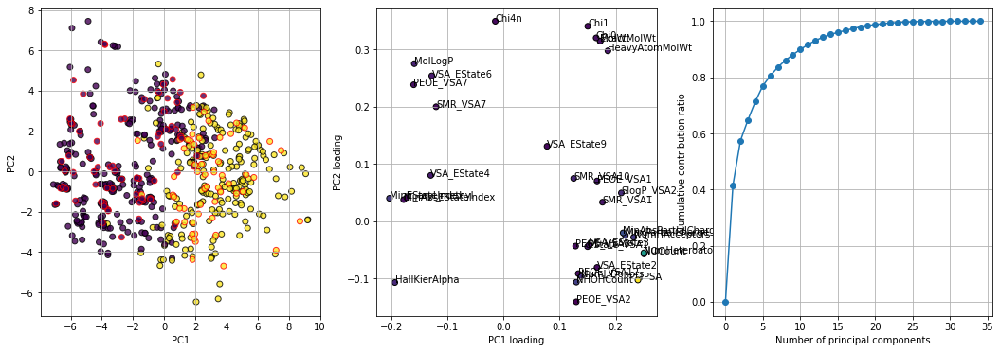

Mordred descriptor (506, 141)


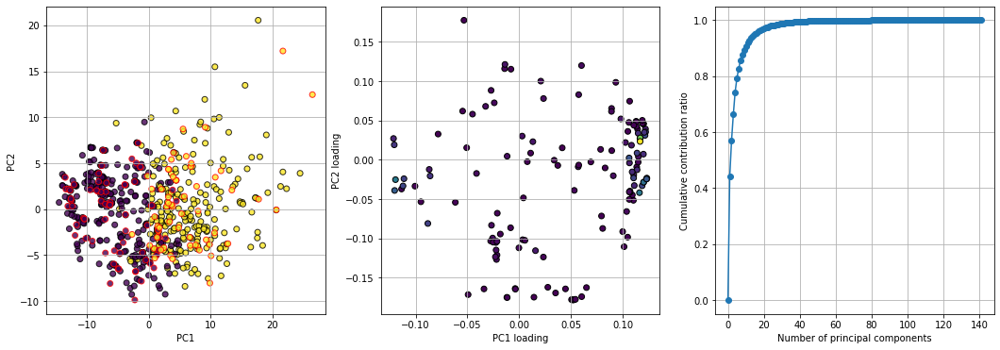

MACCSkeys (506, 119)


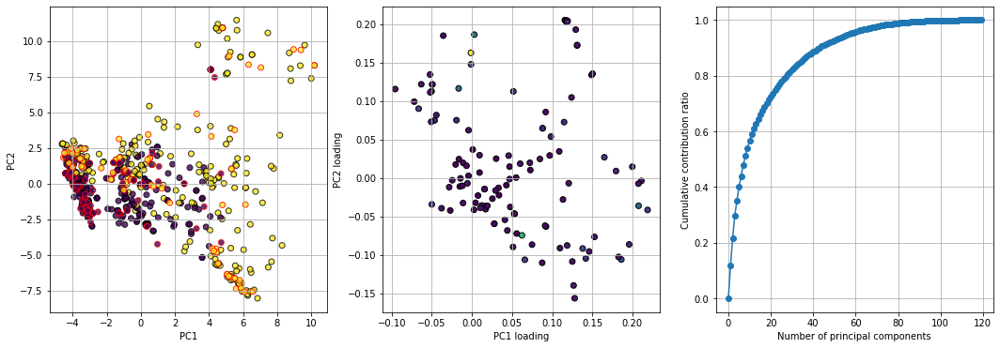

Avalon (506, 488)


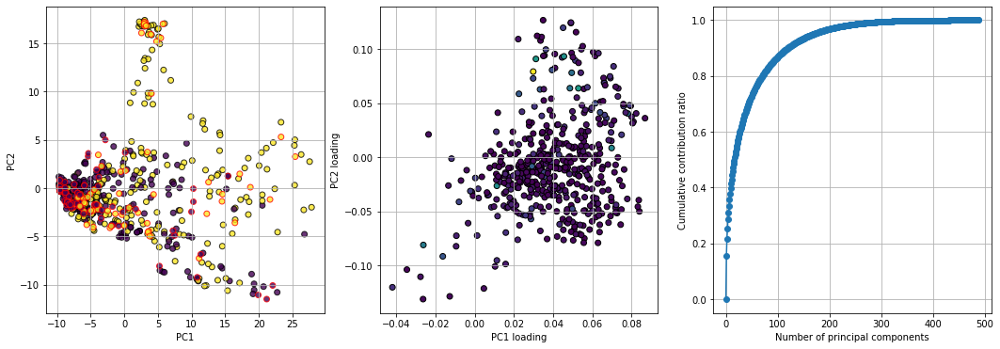

Morgan2(1024bits) (506, 849)


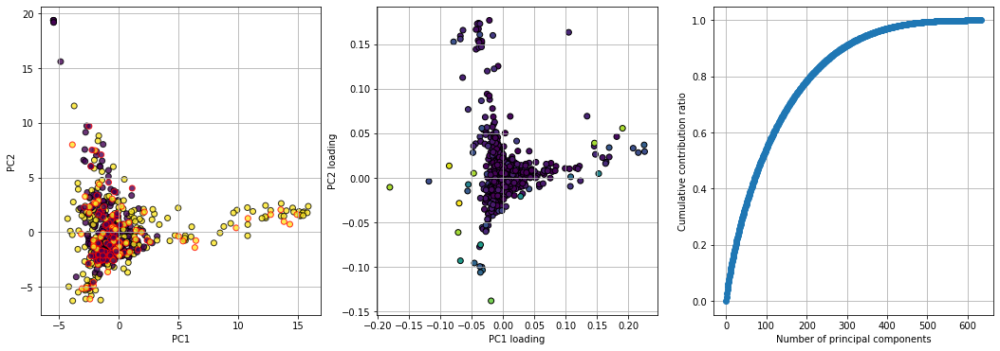

Morgan2F(1024bits) (506, 518)


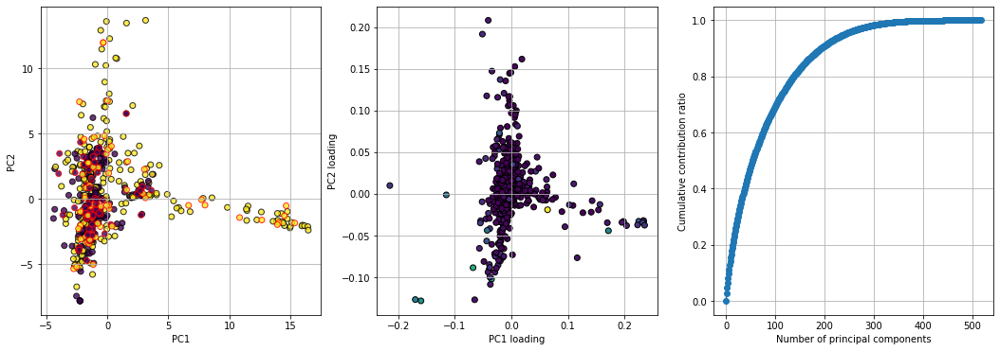

Morgan4(2048bits) (506, 1518)


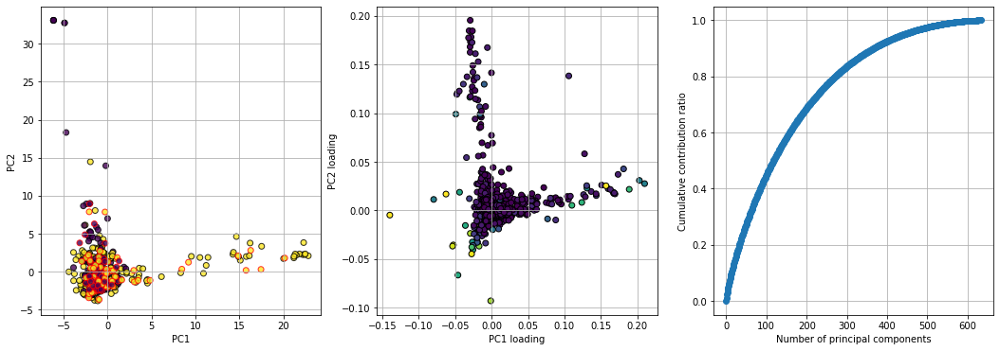

Morgan4F(2048bits) (506, 1303)


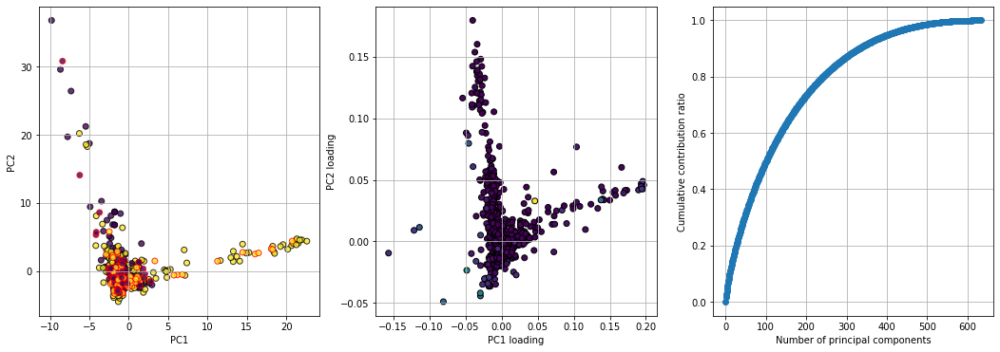

ECFP2 (506, 514)


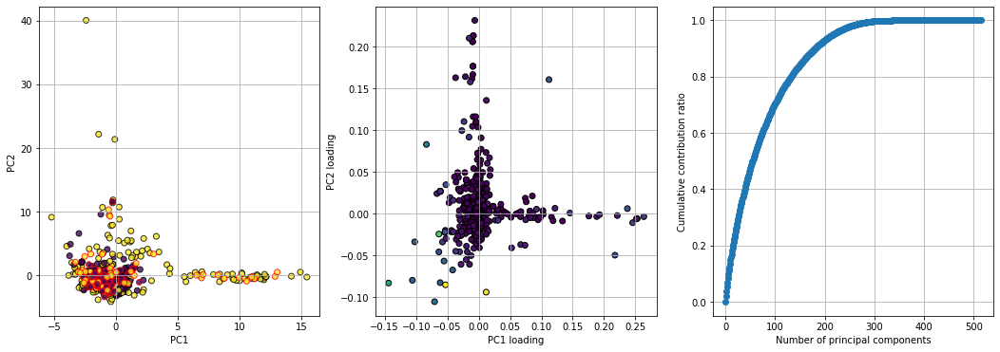

FCFP2 (506, 180)


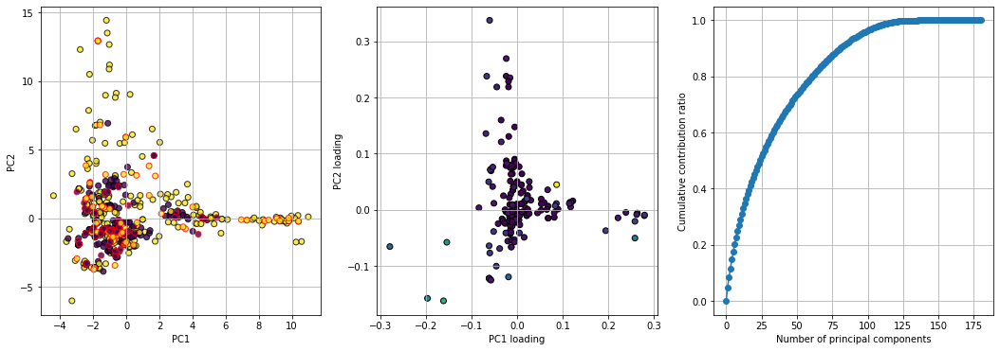

ECFP4 (506, 1795)


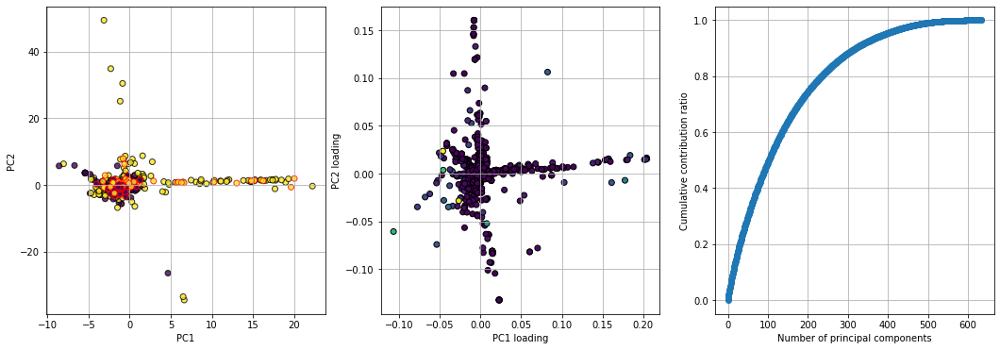

FCFP4 (506, 1030)


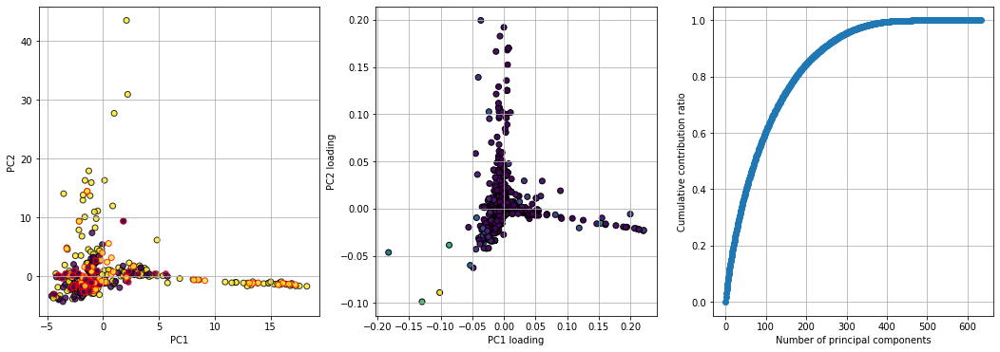

ECFP6 (506, 2872)


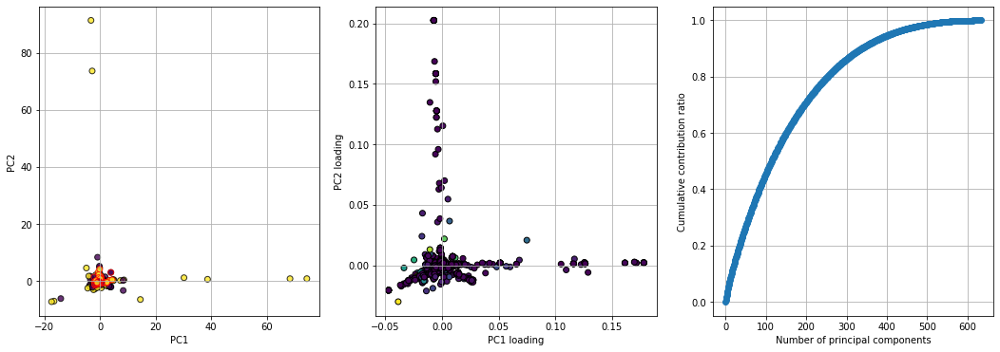

FCFP6 (506, 2173)


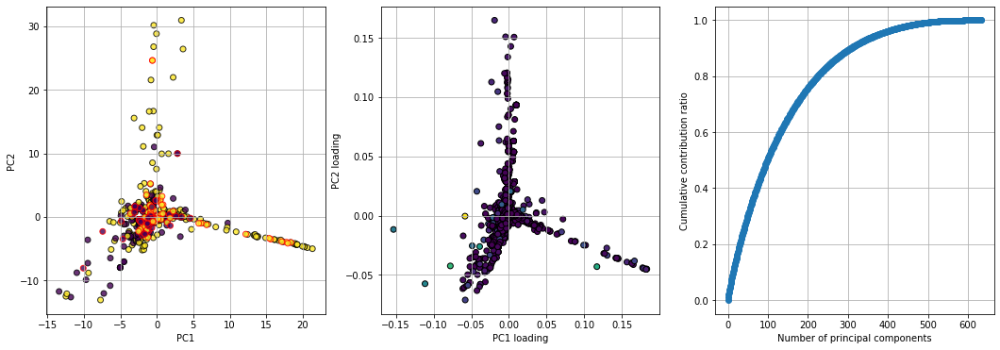

In [ ]:
pcaumap1s = []
for X_train1, X_test1, name, feature_importance in zip(
    [X_train_rdkit1, X_train_mordred1] + X_trains1_selected, 
    [X_test_rdkit1, X_test_mordred1] + X_tests1_selected, 
    ["RDKit descriptor", "Mordred descriptor"] + fingerprinter.names(),
    [feature_importance_rdkit1, feature_importance_mordred1] + feature_importances):

    print(name, X_train1.shape)
    pcaumap1 = all_sklearn.PCAUmap()
    pcaumap1.fit(pd.concat([X_train1, X_test1]))
    pcaumap1s.append(pcaumap1)
    all_sklearn.pca_summary(
        pcaumap1.pca, 
        X_train1, 
        y_train['Molecular refractivity'], 
        X_test1, 
        y_test=y_test['Molecular refractivity'],
        loading_color=feature_importance
        )

RDKit descriptors
inside function
   (0, 0)	1.0
  (0, 79)	0.25770882
  (0, 200)	0.25444493
  (0, 269)	0.38208658
  (0, 308)	0.25588506
  (0, 477)	0.24031502
  (0, 490)	0.30304527
  (0, 493)	0.28415698
  (0, 584)	0.2871222
  (0, 586)	0.2713373
  (0, 587)	0.2719333
  (0, 601)	0.2927587
  (0, 603)	0.25451058
  (0, 619)	0.30198008
  (0, 625)	0.24959764
  (1, 1)	1.0
  (1, 5)	1.0
  (1, 74)	3.8322687e-36
  (1, 102)	1.7393201e-21
  (1, 184)	1.0
  (1, 278)	1.0
  (1, 360)	0.45344722
  (1, 378)	1.1017932e-30
  (1, 391)	1.581819e-24
  (1, 445)	3.5124814e-34
  :	:
  (504, 340)	0.24902739
  (504, 347)	0.30681065
  (504, 420)	0.7010121
  (504, 433)	0.22971274
  (504, 502)	0.20100978
  (504, 504)	1.0
  (504, 537)	0.5039558
  (504, 544)	0.21123597
  (504, 618)	0.22678113
  (504, 623)	0.208508
  (505, 32)	0.14465183
  (505, 50)	0.28295076
  (505, 66)	0.2603124
  (505, 144)	0.286097
  (505, 190)	0.29359207
  (505, 243)	0.31424323
  (505, 351)	0.2594096
  (505, 408)	0.17173631
  (505, 444)	0.14877898
  (5

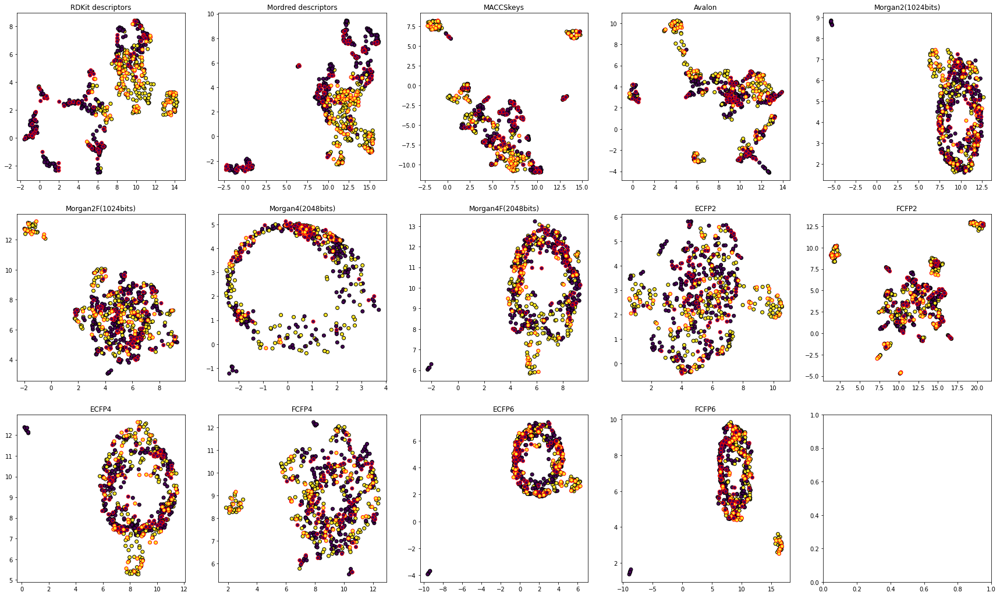

In [ ]:
import matplotlib.pyplot as plt
nrows, ncols = 3, 5
fig, axes = plt.subplots(
            nrows=nrows,
            ncols=ncols,
            figsize=(6*ncols, 6*nrows),
        )
i_ax = 0
for X_train1, X_test1, pcaumap1, name in zip(
    [X_train_rdkit1, X_train_mordred1] + X_trains1_selected, 
    [X_test_rdkit1, X_test_mordred1] + X_tests1_selected, 
    pcaumap1s, 
    ["RDKit descriptors", "Mordred descriptors"] + fingerprinter.names()
    ):
    print(name)
    embed_train1 = pcaumap1.transform(X_train1)
    embed_test1 = pcaumap1.transform(X_test1)
    axes[int(i_ax/ncols)][i_ax%ncols].set_title(name)
    axes[int(i_ax/ncols)][i_ax%ncols].scatter(embed_train1[:, 0], embed_train1[:, 1], edgecolors="k", c=y_train['Molecular refractivity'])
    axes[int(i_ax/ncols)][i_ax%ncols].scatter(embed_test1[:, 0], embed_test1[:, 1], edgecolors="r", c=y_test['Molecular refractivity'])
    i_ax += 1

plt.show()

In [ ]:
!date

Thu Feb 18 06:37:23 UTC 2021


# 選択された特徴の可視化

In [ ]:
import random
from rdkit.Chem.Draw import DrawMorganBits, IPythonConsole

def depict_fp(fp_type, fingerprinter, feature_importances, n_depict=20):
    fp_tuples = []
    legends = []
    for i in np.argsort(feature_importances[fingerprinter.names().index(fp_type)])[::-1]:
        bit = fingerprinter.all_bit_info_keys[fp_type][i]
        #print(i, feature_importances[fingerprinter.names().index(fp_type)][i], bit)

        j_index = [j for j in range(len(fingerprinter.bit_infos[fp_type]))]
        random.shuffle(j_index)
        for j in j_index:
            bit_info = fingerprinter.bit_infos[fp_type][j]
            if bit in bit_info.keys():
                fp_tuples.append((fingerprinter.mols[j], bit, bit_info))
                legends.append(str(bit))
                break

        if len(fp_tuples) >= n_depict:
            break

    return fp_tuples, legends

In [ ]:
fingerprinter.names()

['MACCSkeys',
 'Avalon',
 'Morgan2(1024bits)',
 'Morgan2F(1024bits)',
 'Morgan4(2048bits)',
 'Morgan4F(2048bits)',
 'ECFP2',
 'FCFP2',
 'ECFP4',
 'FCFP4',
 'ECFP6',
 'FCFP6']

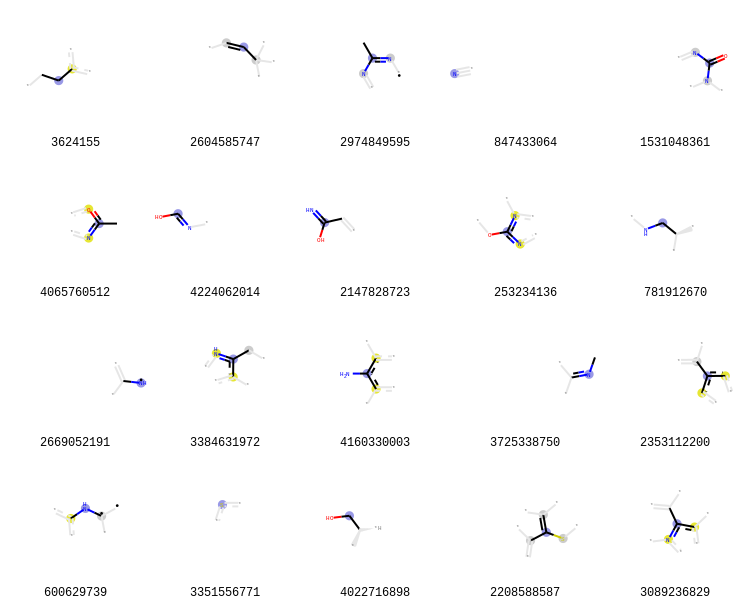

In [ ]:
fp_type = "ECFP2"
fp_tuples, legends = depict_fp(fp_type, fingerprinter, feature_importances, n_depict=20)
DrawMorganBits(fp_tuples, molsPerRow=5, legends=legends)

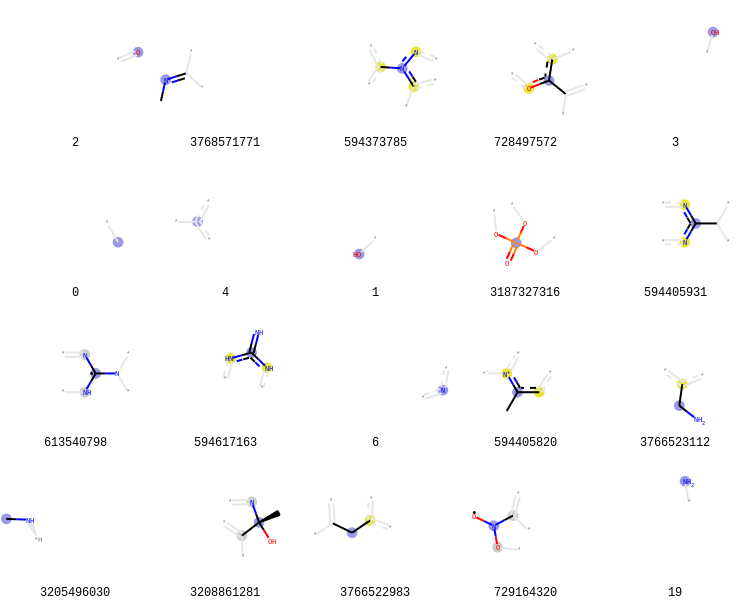

In [ ]:
fp_type = "FCFP2"
fp_tuples, legends = depict_fp(fp_type, fingerprinter, feature_importances, n_depict=20)
DrawMorganBits(fp_tuples, molsPerRow=5, legends=legends)

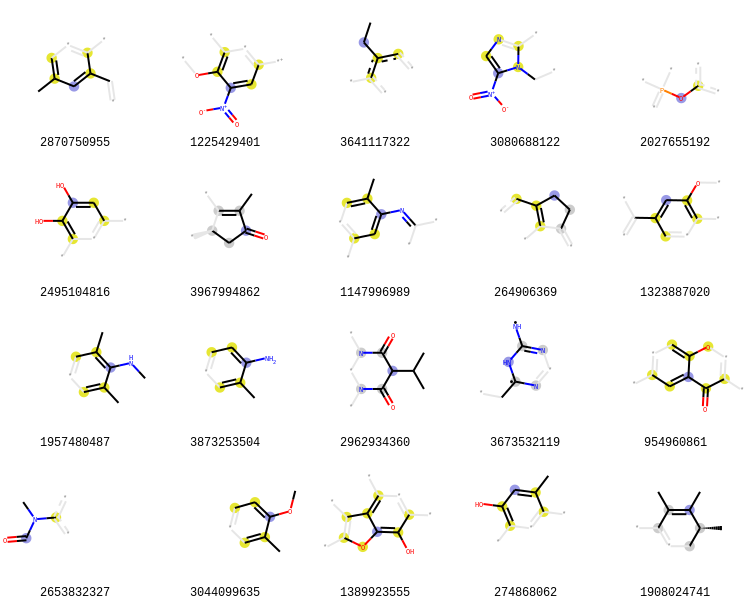

In [ ]:
fp_type = "ECFP4"
fp_tuples, legends = depict_fp(fp_type, fingerprinter, feature_importances, n_depict=20)
DrawMorganBits(fp_tuples, molsPerRow=5, legends=legends)

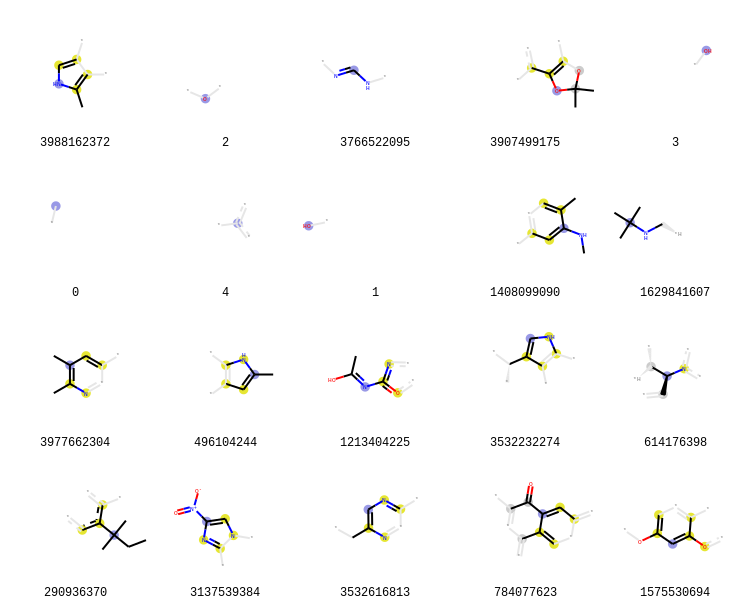

In [ ]:
fp_type = "FCFP4"
fp_tuples, legends = depict_fp(fp_type, fingerprinter, feature_importances, n_depict=20)
DrawMorganBits(fp_tuples, molsPerRow=5, legends=legends)

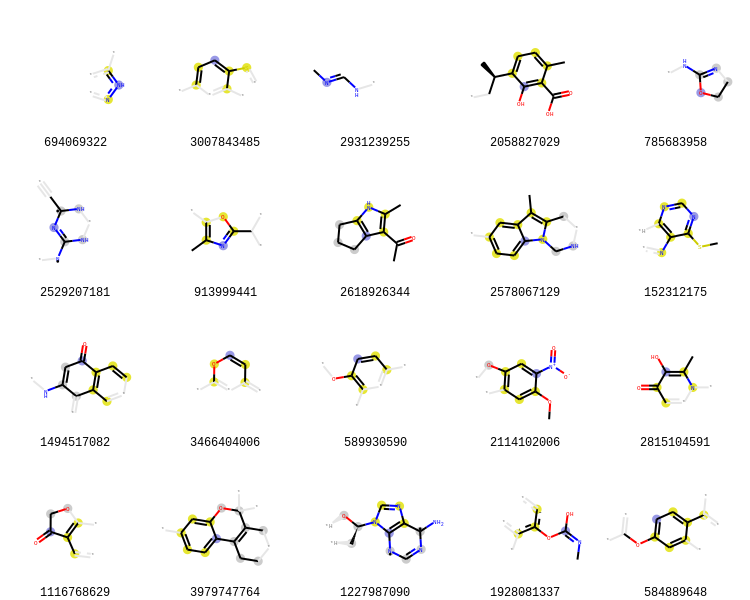

In [ ]:
fp_type = "ECFP6"
fp_tuples, legends = depict_fp(fp_type, fingerprinter, feature_importances, n_depict=20)
DrawMorganBits(fp_tuples, molsPerRow=5, legends=legends)

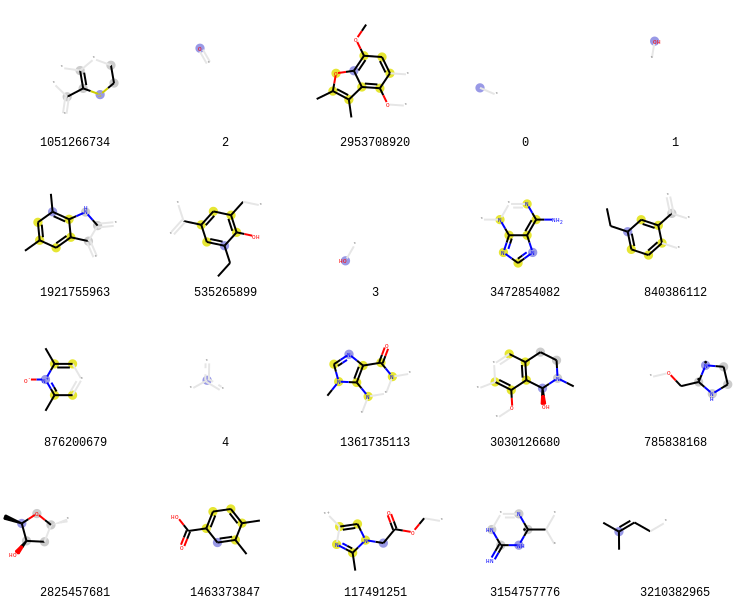

In [ ]:
fp_type = "FCFP6"
fp_tuples, legends = depict_fp(fp_type, fingerprinter, feature_importances, n_depict=20)
DrawMorganBits(fp_tuples, molsPerRow=5, legends=legends)

## 選択された特徴を用いた予測

In [ ]:
import optuna
from scikitallstars import all_sklearn
from sklearn.model_selection import train_test_split

objective1_rdkit = all_sklearn.Objective(X_train_rdkit1, y_train['Molecular refractivity'])

optuna.logging.set_verbosity(optuna.logging.WARN)
model_names = objective1_rdkit.get_model_names()
for model_name in model_names:
    objective1_rdkit.set_model_names([model_name])
    study1 = optuna.create_study(direction='maximize')
    study1.optimize(objective1_rdkit, timeout=100, n_trials=25, show_progress_bar=False)

objective1_rdkit.set_model_names(model_names)
#study1 = optuna.create_study(direction='maximize')
#study1.optimize(objective1_rdkit, timeout=100, n_trials=100, show_progress_bar=True)

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:

In [ ]:
import optuna
from scikitallstars import all_sklearn
from sklearn.model_selection import train_test_split

objective1_mordred = all_sklearn.Objective(X_train_mordred1, y_train['Molecular refractivity'])

optuna.logging.set_verbosity(optuna.logging.WARN)
model_names = objective1_mordred.get_model_names()
for model_name in model_names:
    objective1_mordred.set_model_names([model_name])
    study1 = optuna.create_study(direction='maximize')
    study1.optimize(objective1_mordred, timeout=100, n_trials=25, show_progress_bar=False)

objective1_mordred.set_model_names(model_names)
#study1 = optuna.create_study(direction='maximize')
#study1.optimize(objective1_mordred, timeout=100, n_trials=100, show_progress_bar=True)

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:

In [ ]:
import optuna
from scikitallstars import all_sklearn
from sklearn.model_selection import train_test_split

objective1s = []
for X_train1, X_test1, name in zip(X_trains1_selected, X_tests1_selected, fingerprinter.names()):
    objective1 = all_sklearn.Objective(X_train1, y_train['Molecular refractivity'])

    optuna.logging.set_verbosity(optuna.logging.WARN)
    model_names = objective1.get_model_names()
    for model_name in model_names:
        print(name, model_name)
        objective1.set_model_names([model_name])
        study1 = optuna.create_study(direction='maximize')
        study1.optimize(objective1, timeout=100, n_trials=25, show_progress_bar=False)

    objective1.set_model_names(model_names)
    #study1 = optuna.create_study(direction='maximize')
    #study1.optimize(objective1, timeout=100, n_trials=25, show_progress_bar=False)

    objective1s.append(objective1)

MACCSkeys GradientBoosting
MACCSkeys RandomForest
MACCSkeys MLP
MACCSkeys SVC
MACCSkeys kNN
MACCSkeys Ridge
MACCSkeys QDA


/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:

MACCSkeys LDA
MACCSkeys LogisticRegression
Avalon GradientBoosting
Avalon RandomForest
Avalon MLP
Avalon SVC
Avalon kNN
Avalon Ridge
Avalon QDA


/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:

Avalon LDA
Avalon LogisticRegression
Morgan2(1024bits) GradientBoosting
Morgan2(1024bits) RandomForest
Morgan2(1024bits) MLP
Morgan2(1024bits) SVC
Morgan2(1024bits) kNN
Morgan2(1024bits) Ridge
Morgan2(1024bits) QDA


/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:

Morgan2(1024bits) LDA
Morgan2(1024bits) LogisticRegression
Morgan2F(1024bits) GradientBoosting
Morgan2F(1024bits) RandomForest
Morgan2F(1024bits) MLP
Morgan2F(1024bits) SVC
Morgan2F(1024bits) kNN
Morgan2F(1024bits) Ridge
Morgan2F(1024bits) QDA


/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:

Morgan2F(1024bits) LDA
Morgan2F(1024bits) LogisticRegression
Morgan4(2048bits) GradientBoosting
Morgan4(2048bits) RandomForest
Morgan4(2048bits) MLP
Morgan4(2048bits) SVC
Morgan4(2048bits) kNN
Morgan4(2048bits) Ridge
Morgan4(2048bits) QDA


/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:

Morgan4(2048bits) LDA
Morgan4(2048bits) LogisticRegression
Morgan4F(2048bits) GradientBoosting
Morgan4F(2048bits) RandomForest
Morgan4F(2048bits) MLP
Morgan4F(2048bits) SVC
Morgan4F(2048bits) kNN
Morgan4F(2048bits) Ridge
Morgan4F(2048bits) QDA


/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:

Morgan4F(2048bits) LDA
Morgan4F(2048bits) LogisticRegression
ECFP2 GradientBoosting
ECFP2 RandomForest
ECFP2 MLP
ECFP2 SVC
ECFP2 kNN
ECFP2 Ridge
ECFP2 QDA


/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:

ECFP2 LDA
ECFP2 LogisticRegression
FCFP2 GradientBoosting
FCFP2 RandomForest
FCFP2 MLP
FCFP2 SVC
FCFP2 kNN
FCFP2 Ridge
FCFP2 QDA


/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:

FCFP2 LDA
FCFP2 LogisticRegression
ECFP4 GradientBoosting
ECFP4 RandomForest
ECFP4 MLP
ECFP4 SVC
ECFP4 kNN
ECFP4 Ridge
ECFP4 QDA


/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:

ECFP4 LDA
ECFP4 LogisticRegression
FCFP4 GradientBoosting
FCFP4 RandomForest
FCFP4 MLP
FCFP4 SVC
FCFP4 kNN
FCFP4 Ridge
FCFP4 QDA


/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:

FCFP4 LDA
FCFP4 LogisticRegression
ECFP6 GradientBoosting
ECFP6 RandomForest
ECFP6 MLP
ECFP6 SVC
ECFP6 kNN
ECFP6 Ridge
ECFP6 QDA


/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:

ECFP6 LDA
ECFP6 LogisticRegression
FCFP6 GradientBoosting
FCFP6 RandomForest
FCFP6 MLP
FCFP6 SVC
FCFP6 kNN
FCFP6 Ridge
FCFP6 QDA


/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:691: UserWarning:

Variables are collinear

/usr/local/lib/python3.6/dist-packages/sklearn/discriminant_analysis.py:

FCFP6 LDA
FCFP6 LogisticRegression


RDKit descriptors


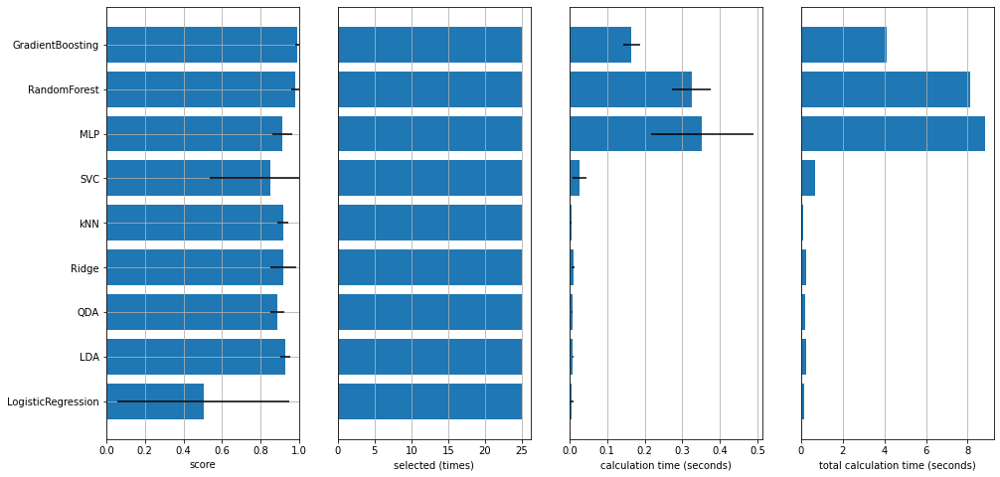

Mordred descriptors


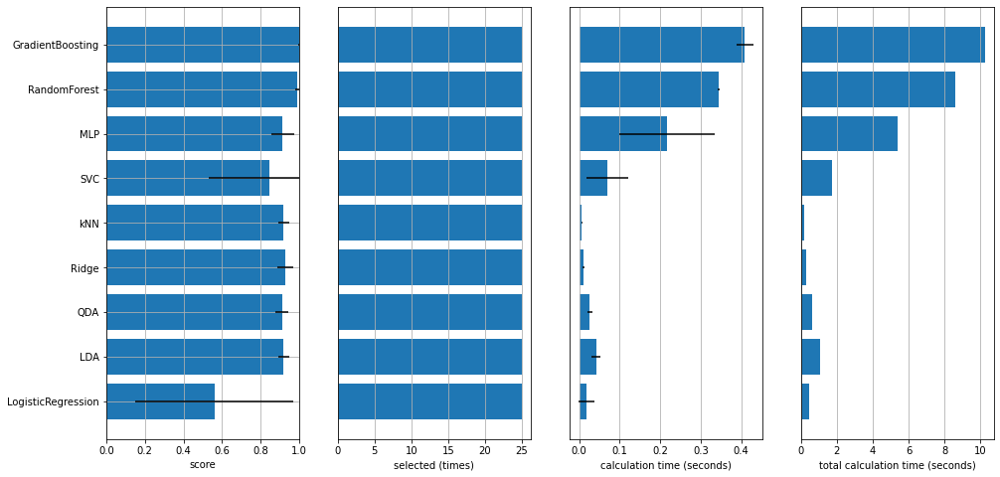

MACCSkeys


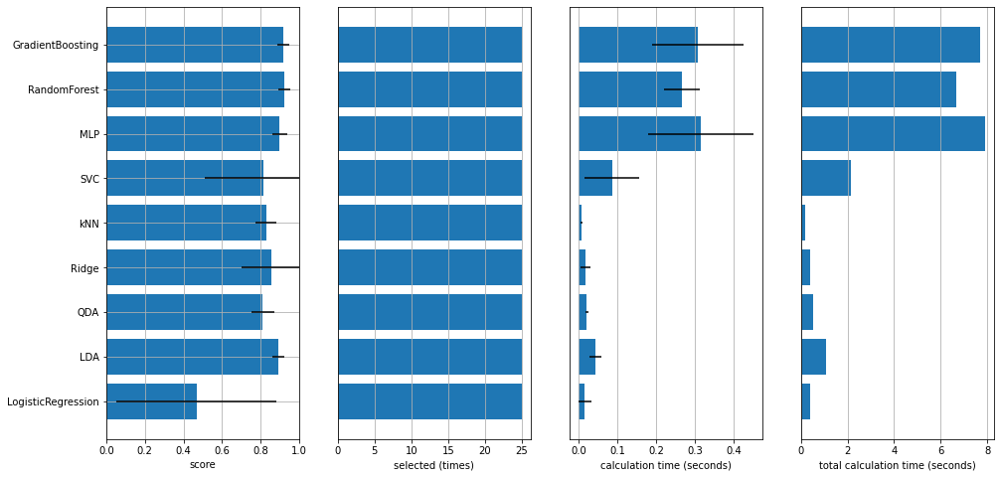

Avalon


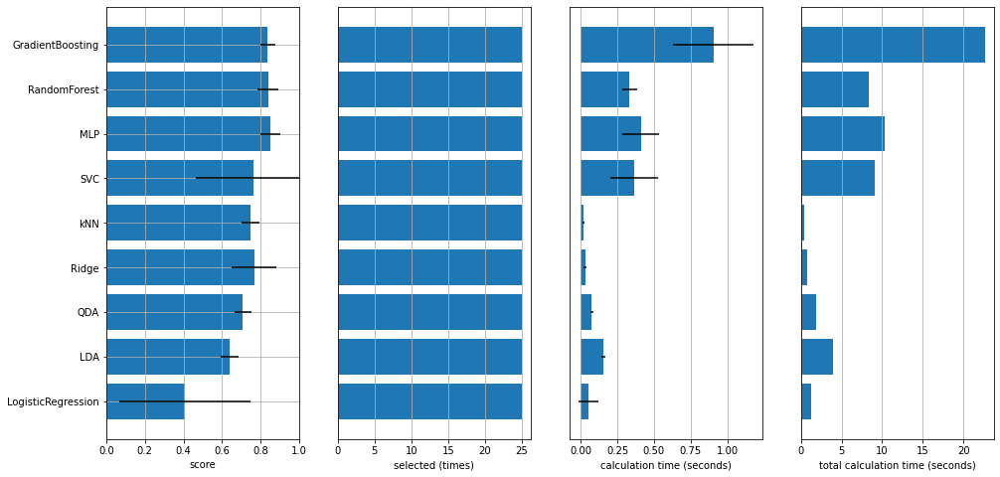

Morgan2(1024bits)


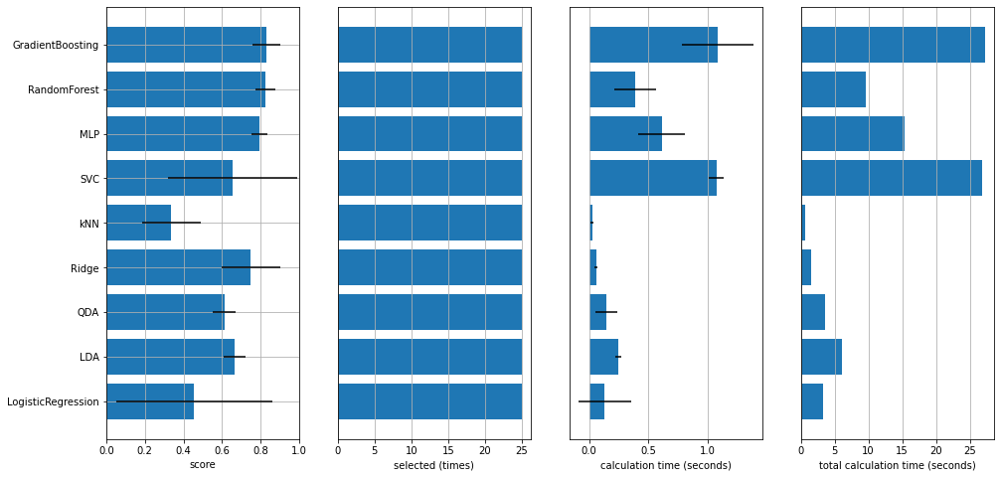

Morgan2F(1024bits)


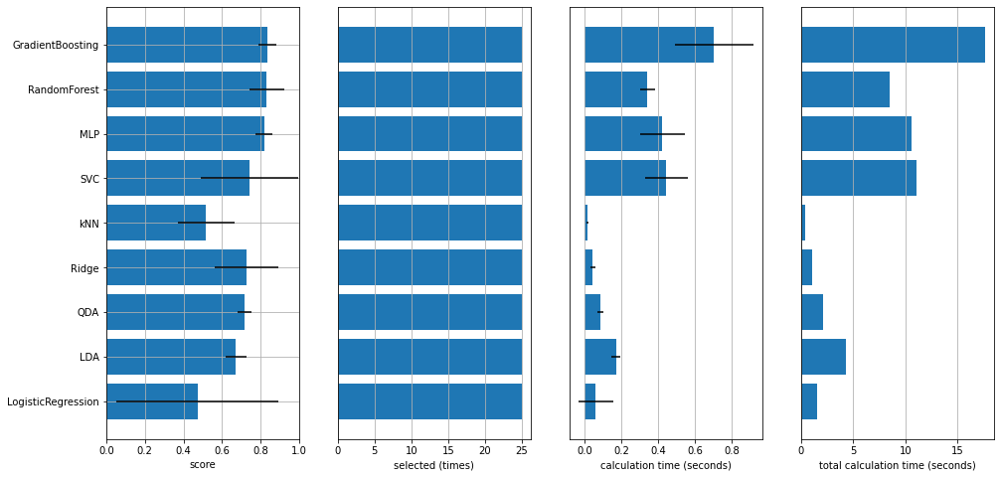

Morgan4(2048bits)


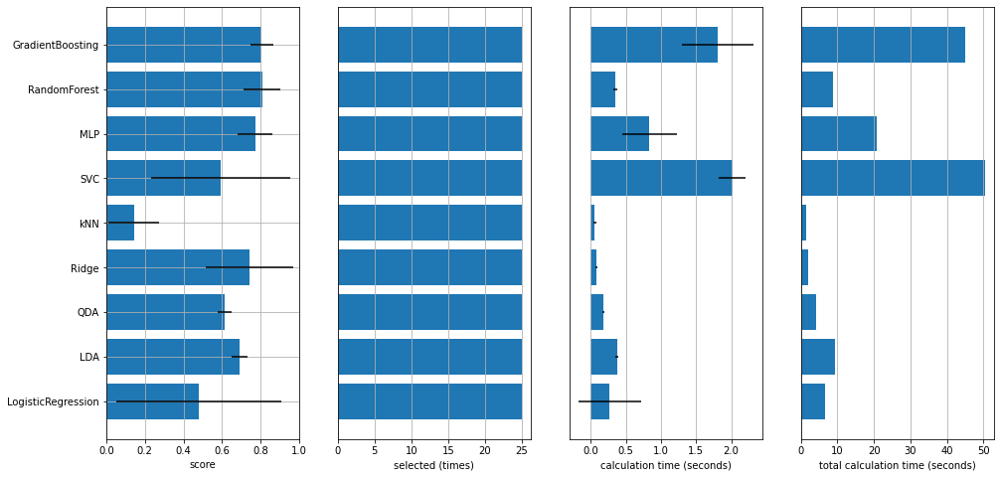

Morgan4F(2048bits)


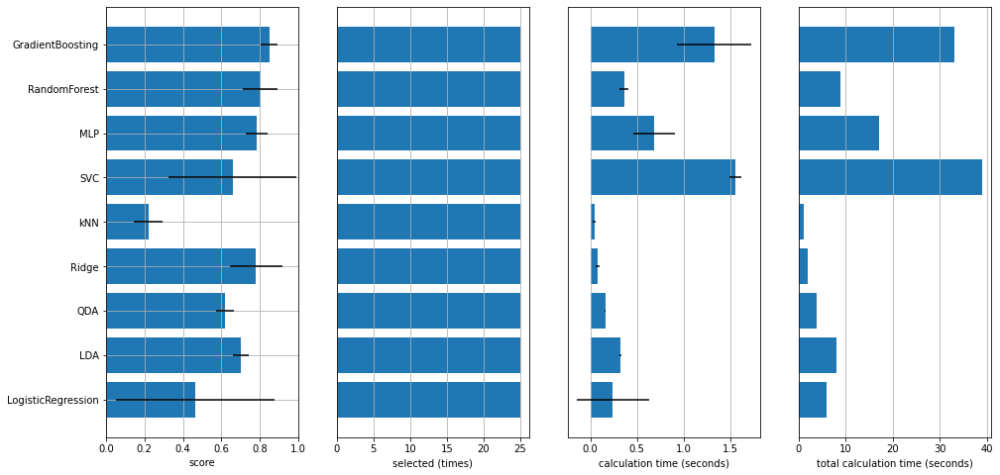

ECFP2


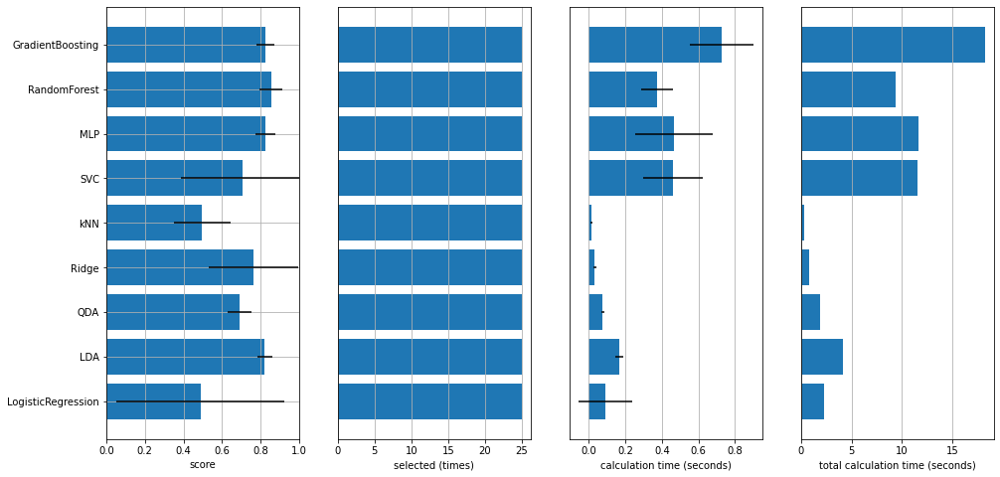

FCFP2


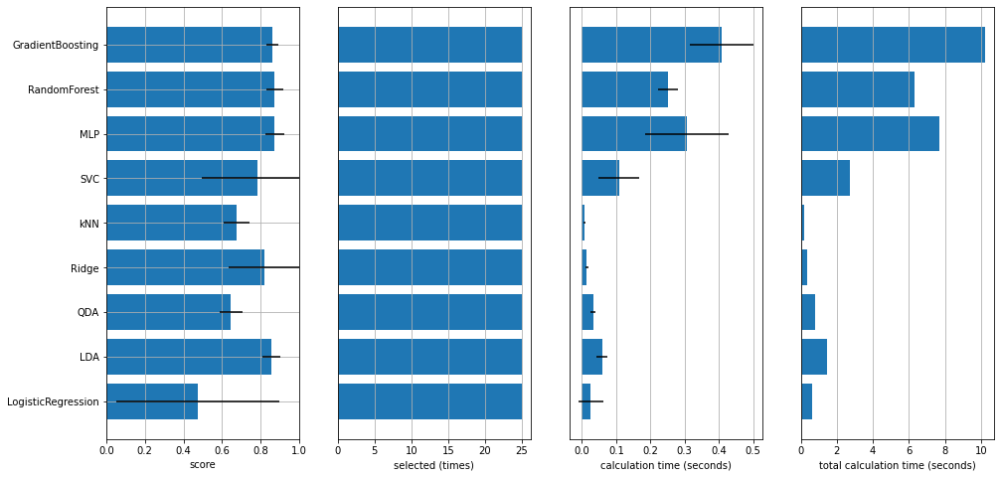

ECFP4


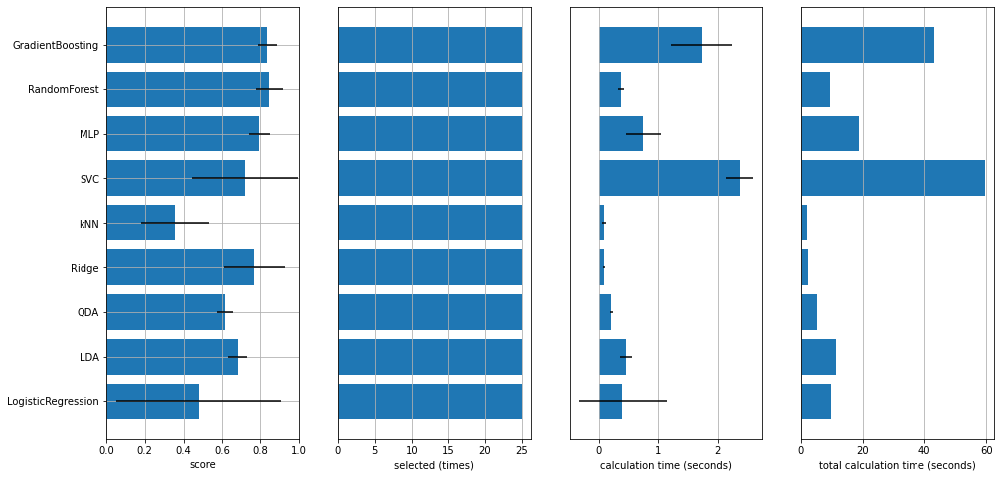

FCFP4


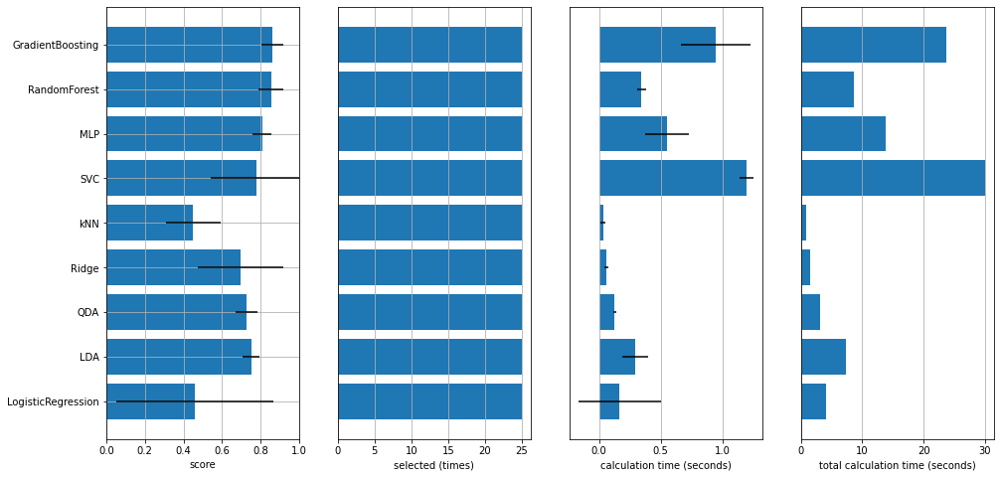

ECFP6


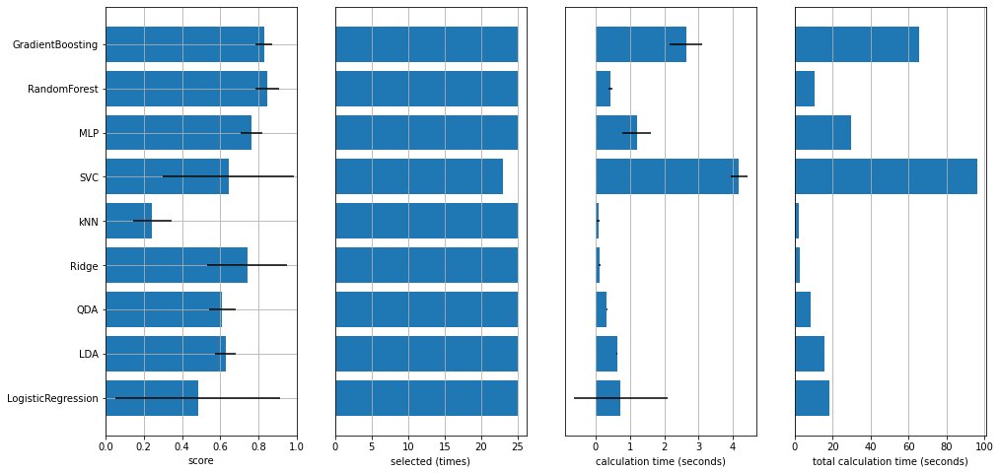

FCFP6


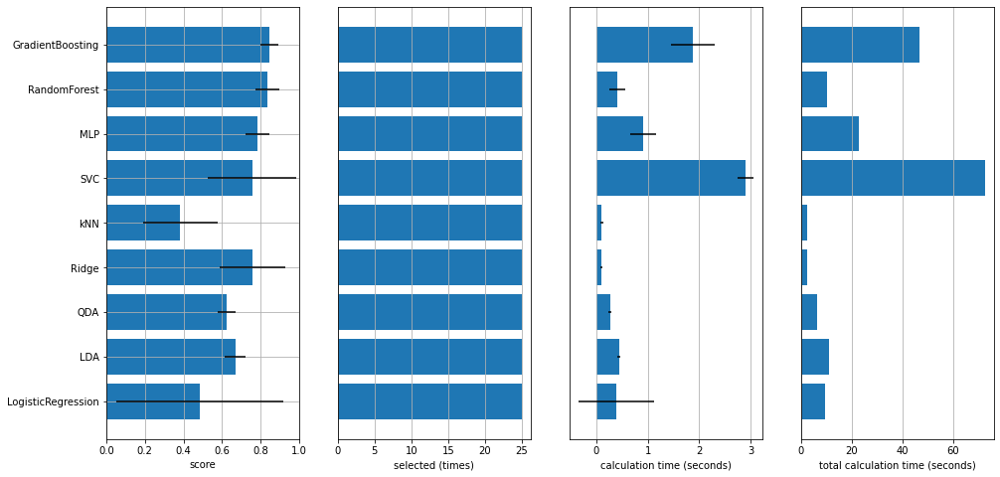

In [ ]:
for objective1, name in zip(
    [objective1_rdkit, objective1_mordred] + objective1s, 
    ["RDKit descriptors", "Mordred descriptors"] + fingerprinter.names()
    ):
    print(name)
    all_sklearn.objective_summary(objective1)

RDKit descriptors


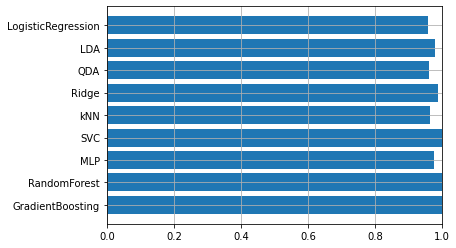

Mordred descriptors


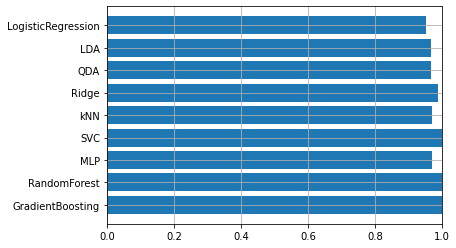

MACCSkeys


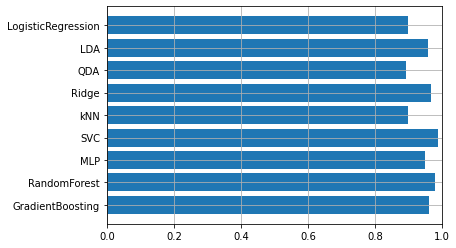

Avalon


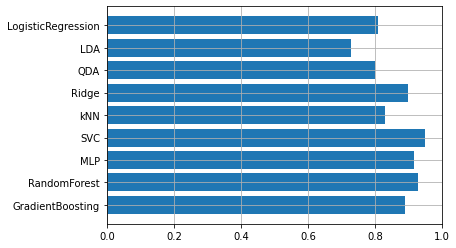

Morgan2(1024bits)


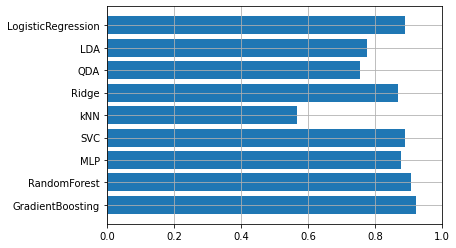

Morgan2F(1024bits)


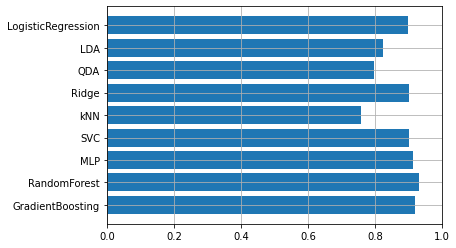

Morgan4(2048bits)


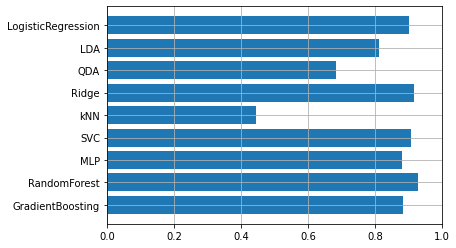

Morgan4F(2048bits)


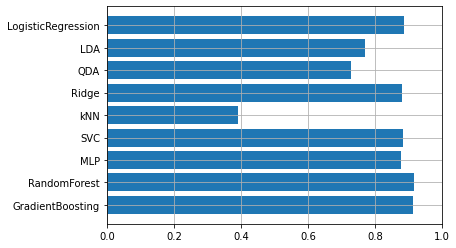

ECFP2


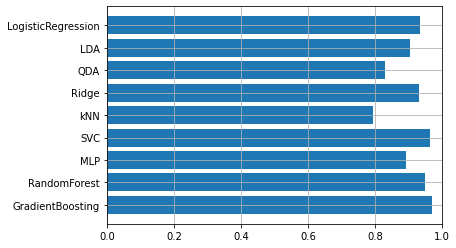

FCFP2


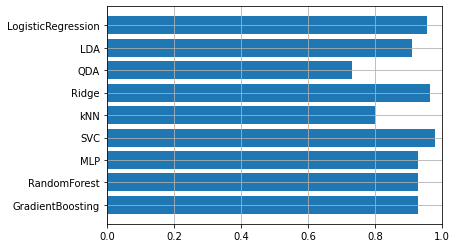

ECFP4


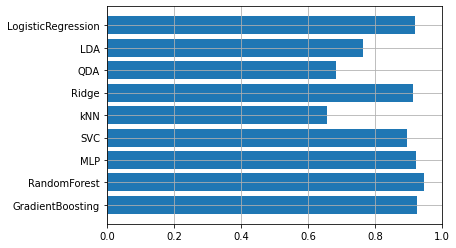

FCFP4


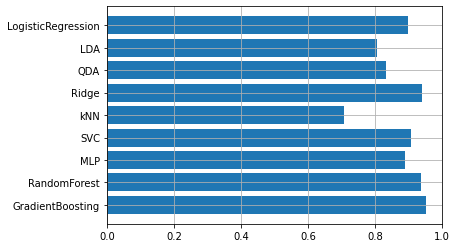

ECFP6


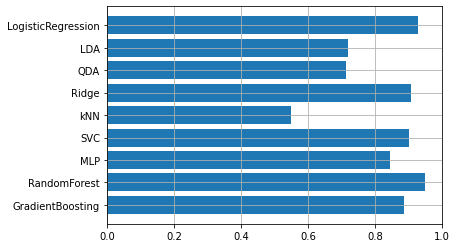

FCFP6


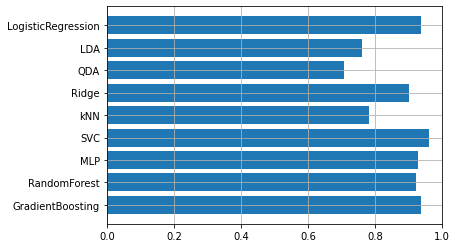

In [ ]:
import matplotlib.pyplot as plt
for objective1, name in zip(
    [objective1_rdkit, objective1_mordred] + objective1s, 
    ["RDKit descriptors", "Mordred descriptors"] + fingerprinter.names()
    ):
    print(name)
    plt.barh([x for x in range(len(objective1.best_scores.items()))], list(objective1.best_scores.values()), tick_label=list(objective1.best_scores.keys()))
    plt.xlim([0, 1])
    plt.grid()
    plt.show()

RDKit descriptors


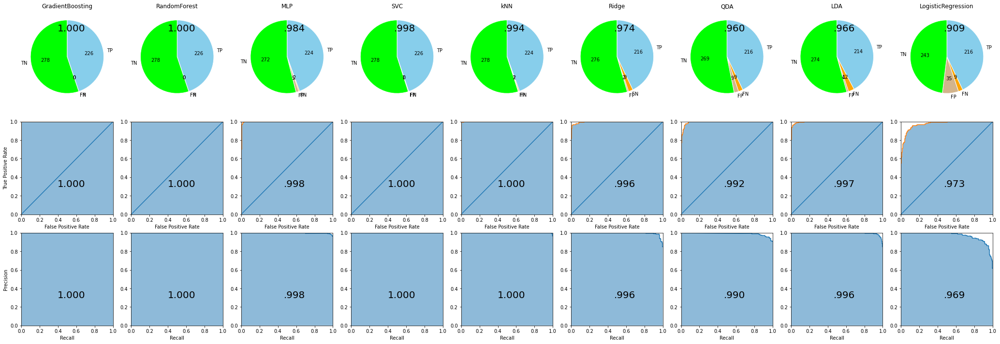

Mordred descriptors


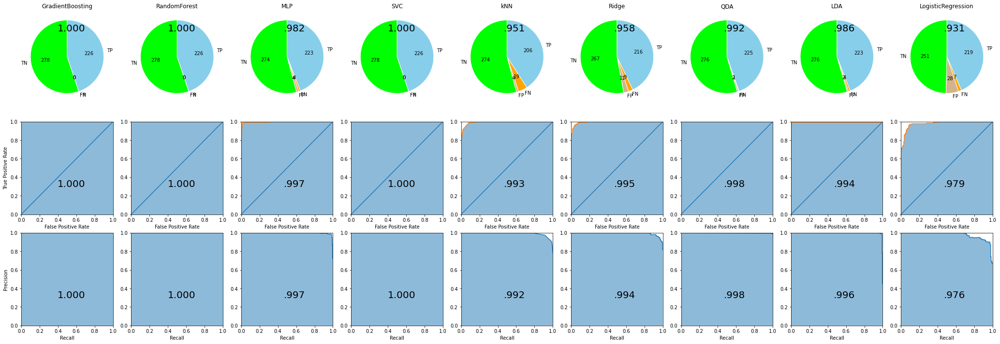

MACCSkeys


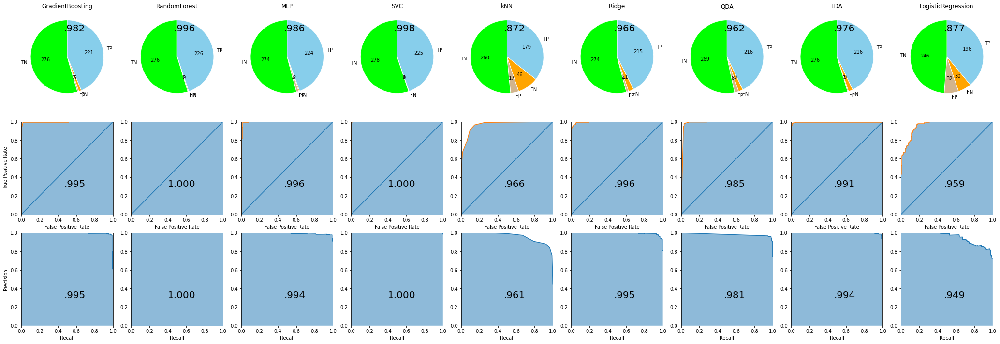

Avalon


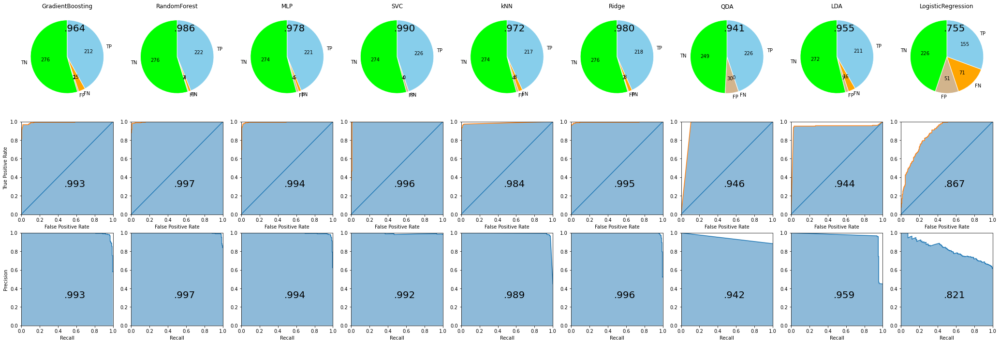

Morgan2(1024bits)


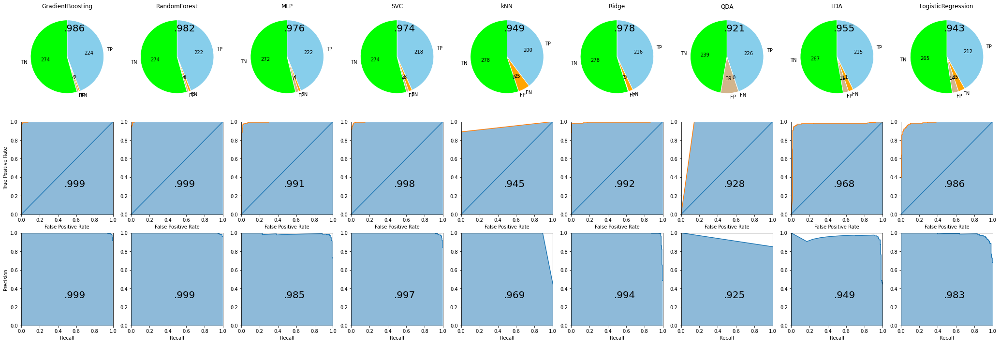

Morgan2F(1024bits)


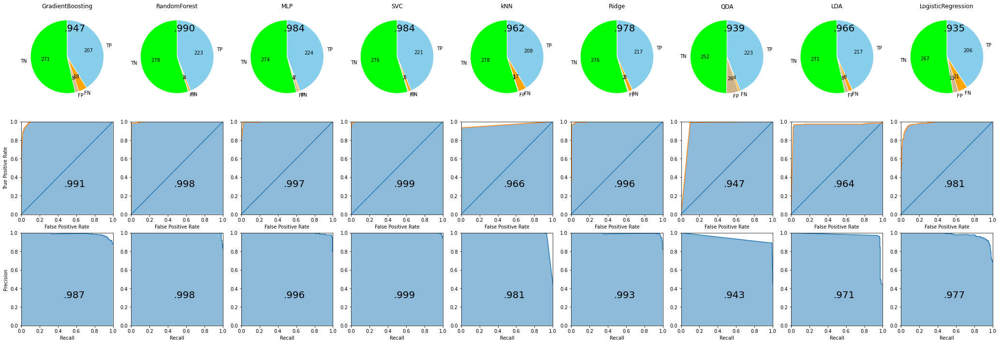

Morgan4(2048bits)


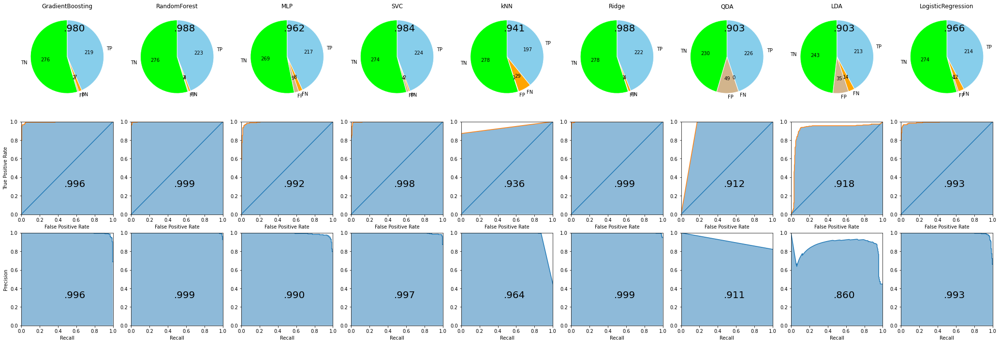

Morgan4F(2048bits)


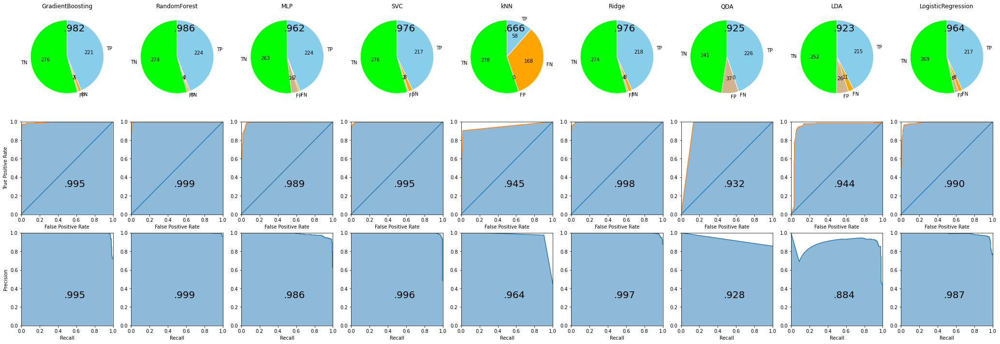

ECFP2


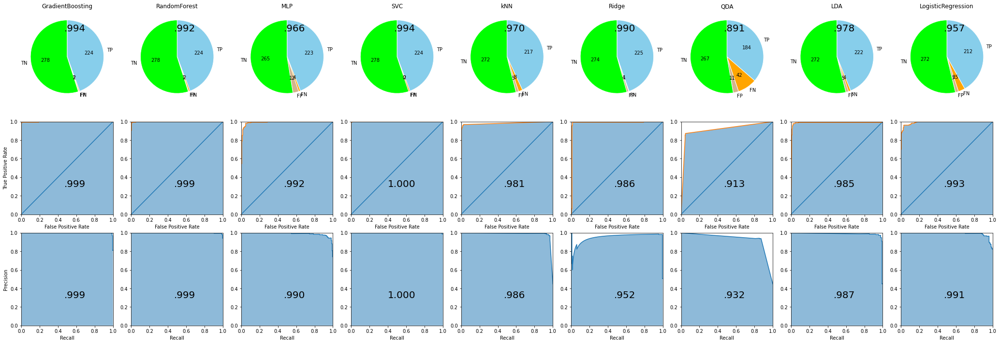

FCFP2


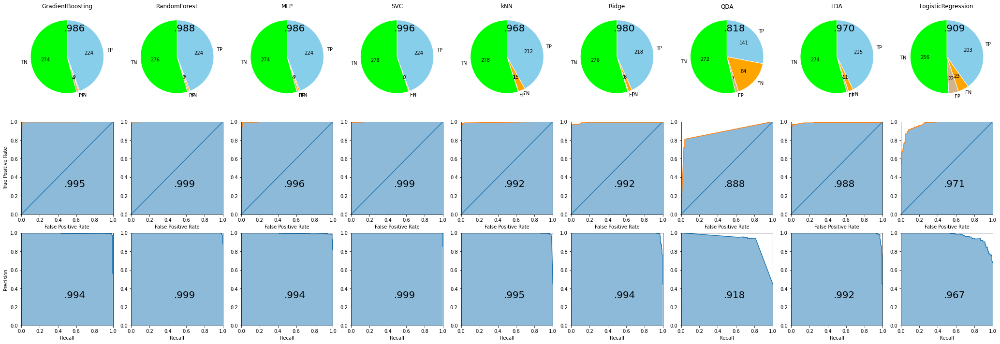

ECFP4


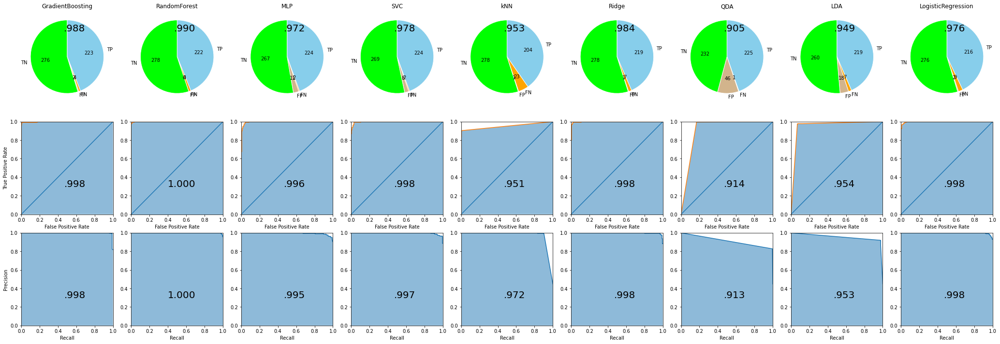

FCFP4


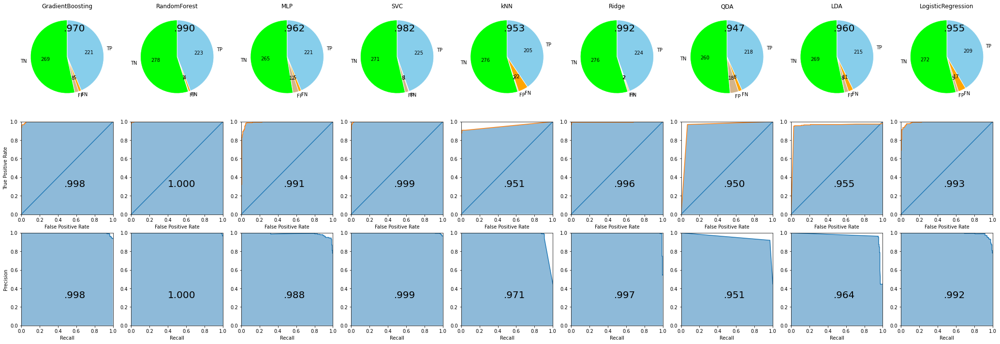

ECFP6


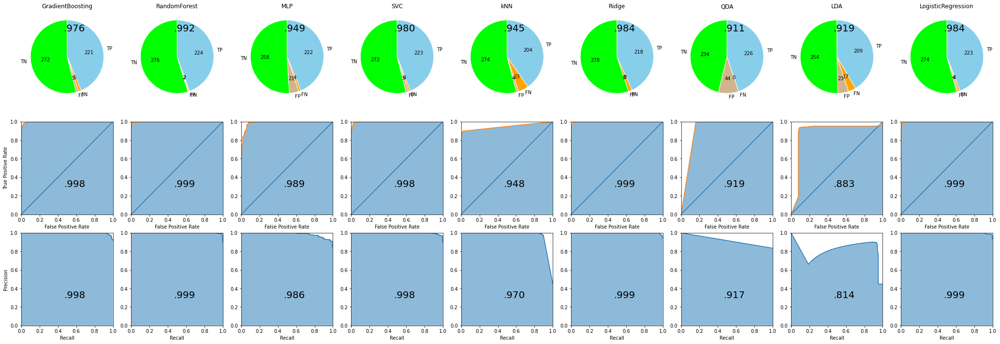

FCFP6


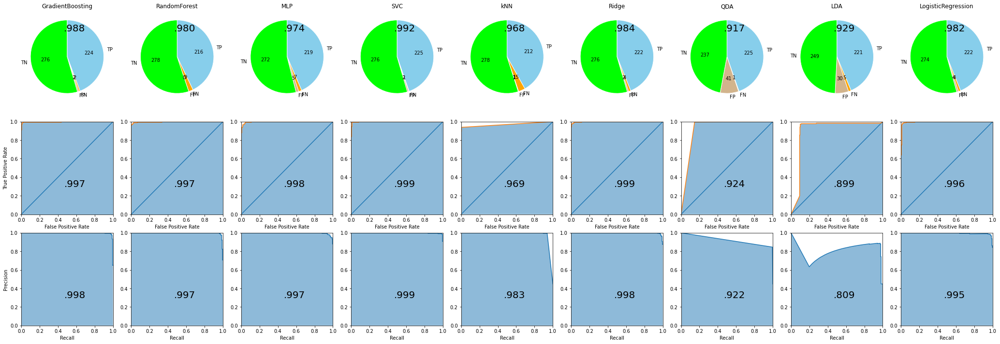

In [ ]:
for X_train1, X_test1, objective1, name in zip(
    [X_train_rdkit1, X_train_mordred1] + X_trains1_selected, 
    [X_test_rdkit1, X_test_mordred1] + X_tests1_selected, 
    [objective1_rdkit, objective1_mordred] + objective1s, 
    ["RDKit descriptors", "Mordred descriptors"] + fingerprinter.names()
    ):
    print(name)
    objective1.set_model_names(model_names)
    all_sklearn.show_allsklearn_metrics(objective1, X_train1, y_train['Molecular refractivity'])

RDKit descriptors


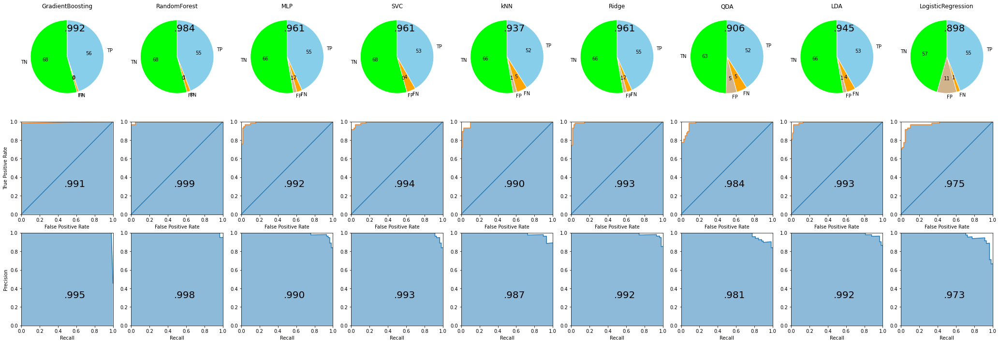

Mordred descriptors


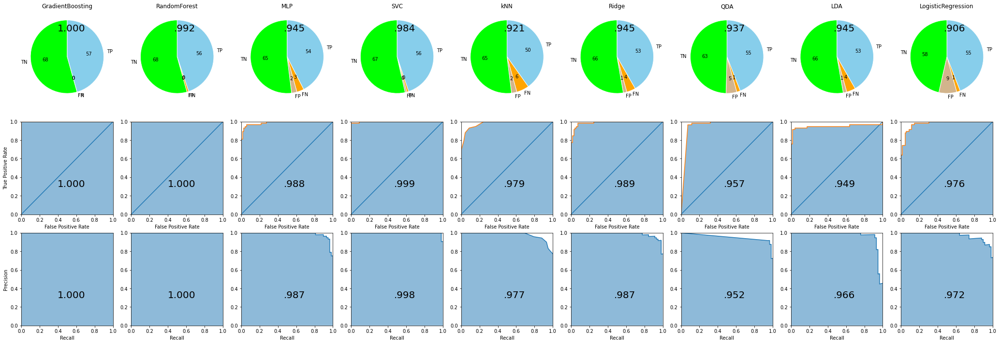

MACCSkeys


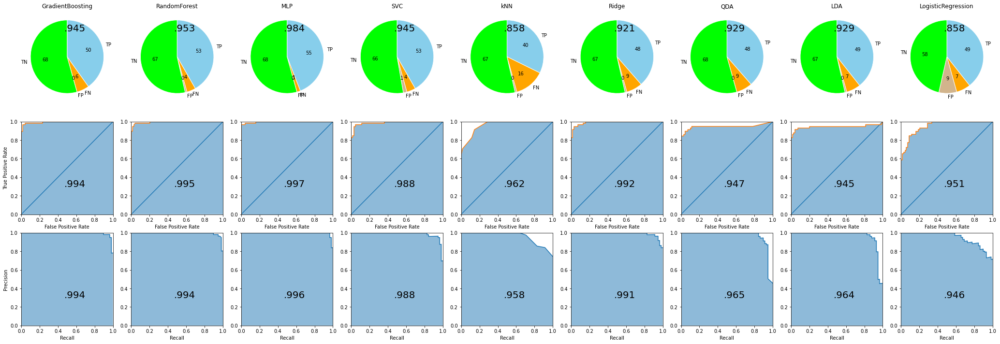

Avalon


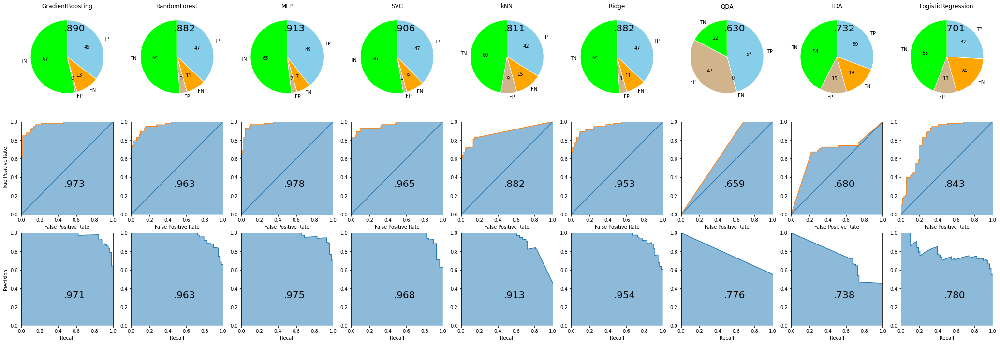

Morgan2(1024bits)


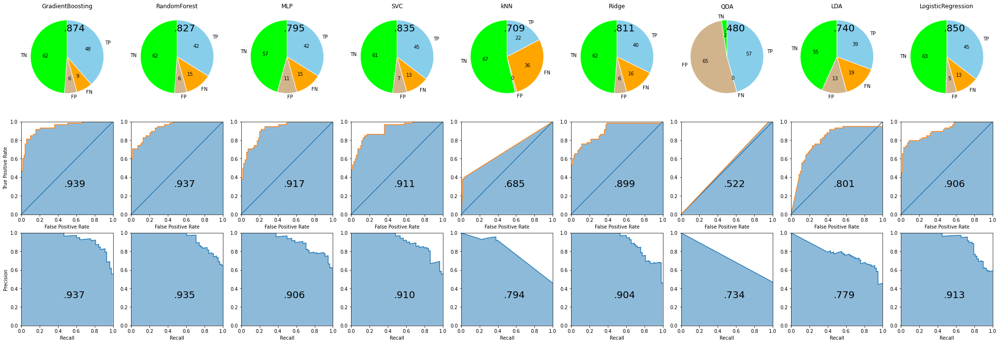

Morgan2F(1024bits)


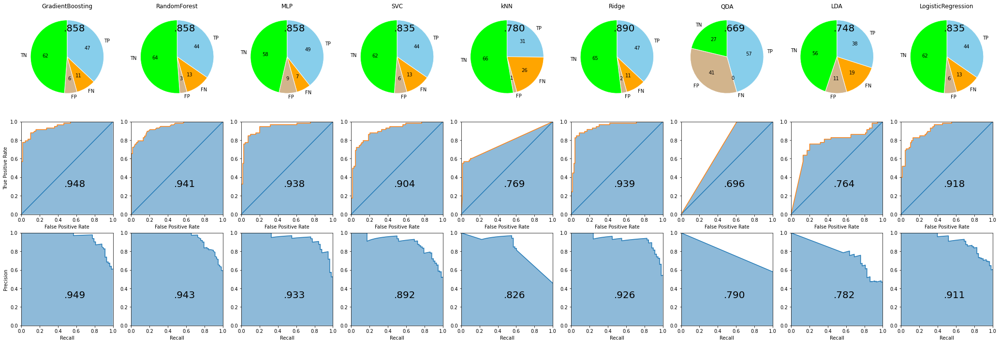

Morgan4(2048bits)


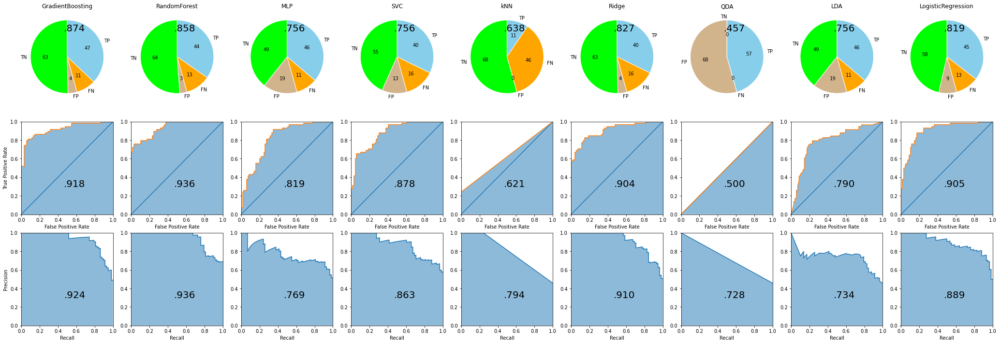

Morgan4F(2048bits)


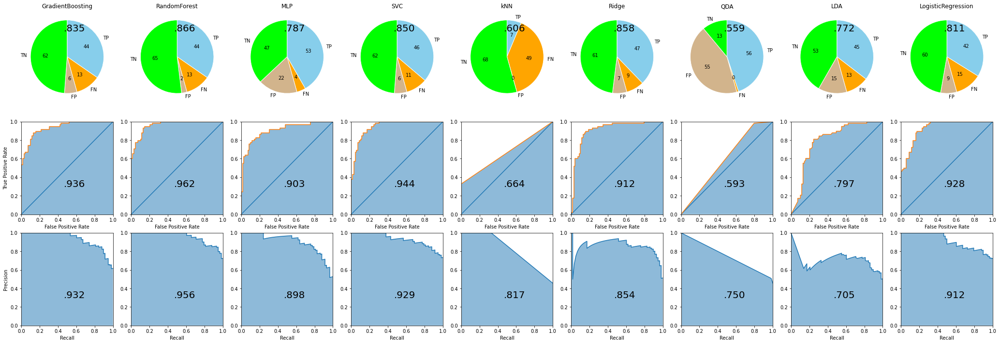

ECFP2


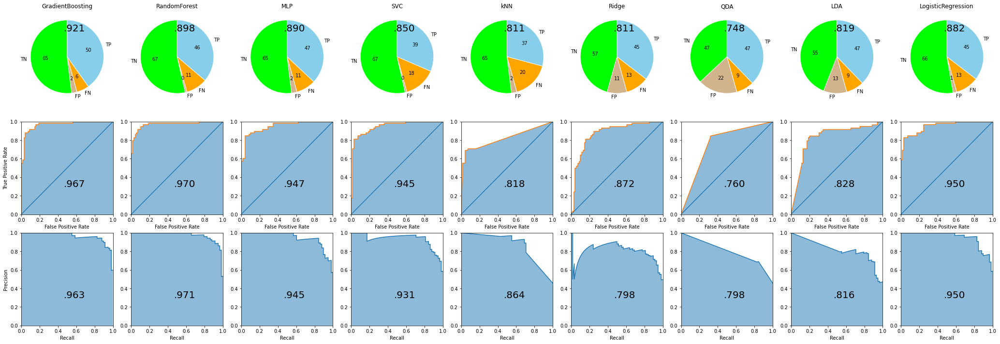

FCFP2


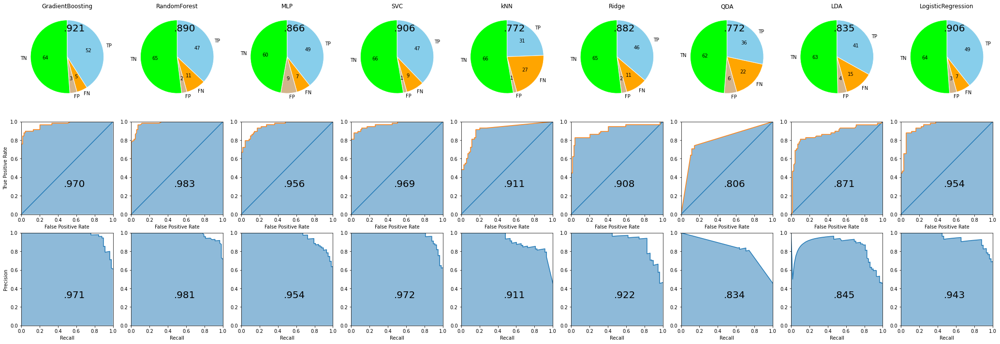

ECFP4


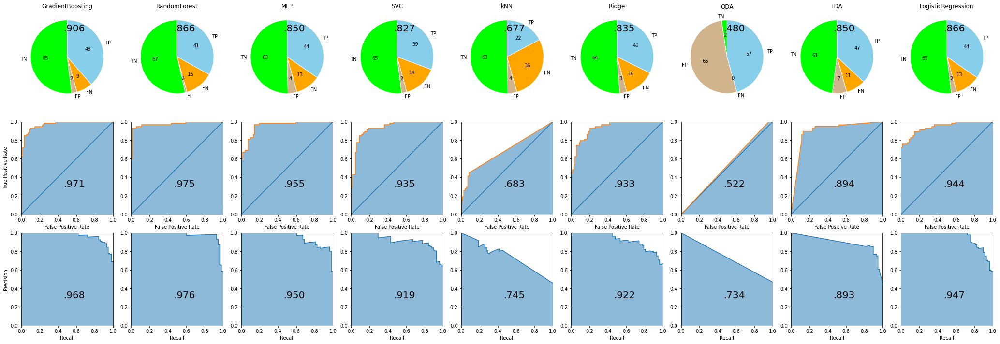

FCFP4


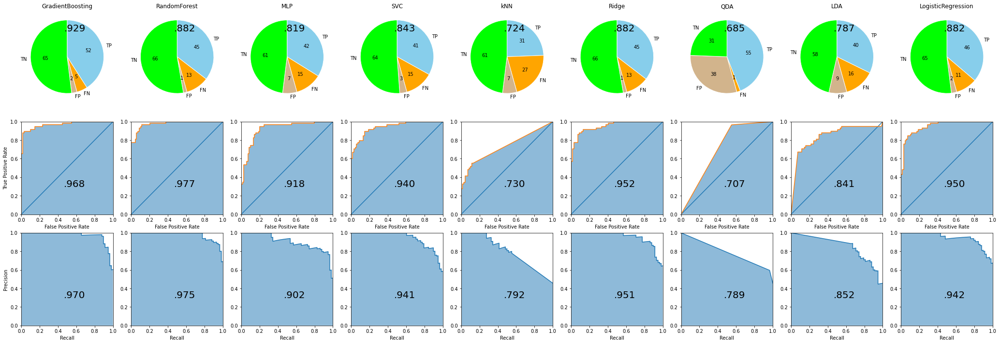

ECFP6


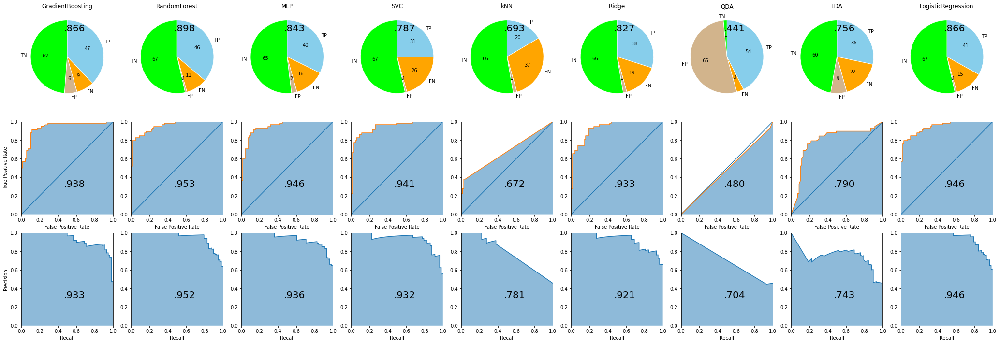

FCFP6


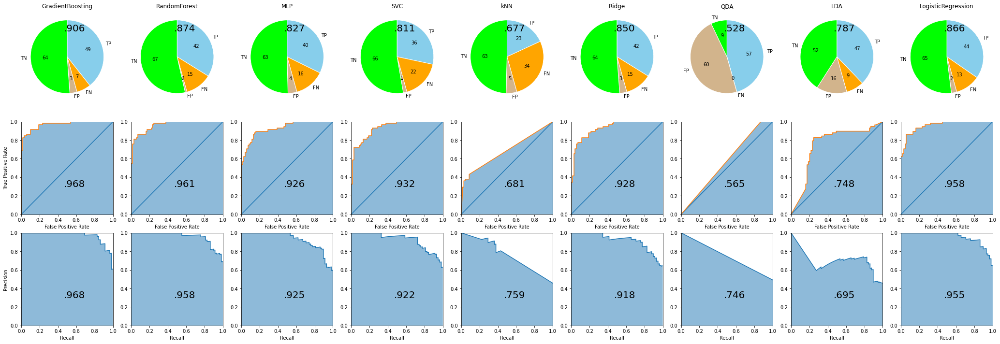

In [ ]:
for X_train1, X_test1, objective1, name in zip(
    [X_train_rdkit1, X_train_mordred1] + X_trains1_selected, 
    [X_test_rdkit1, X_test_mordred1] + X_tests1_selected, 
    [objective1_rdkit, objective1_mordred] + objective1s, 
    ["RDKit descriptors", "Mordred descriptors"] + fingerprinter.names()
    ):
    print(name)
    objective1.set_model_names(model_names)
    all_sklearn.show_allsklearn_metrics(objective1, X_test1, y_test['Molecular refractivity'])

In [ ]:
!date

Thu Feb 18 07:04:05 UTC 2021


In [ ]:
stacking_model1s = []

names4barh = []
scores4barh = []
for X_train1, X_test1, objective1, name, pcaumap1 in zip(
    [X_train_rdkit1, X_train_mordred1] + X_trains1_selected, 
    [X_test_rdkit1, X_test_mordred1] + X_tests1_selected, 
    [objective1_rdkit, objective1_mordred] + objective1s, 
    ["RDKit descriptors", "Mordred descriptors"] + fingerprinter.names(), 
    pcaumap1s
    ):

    stacking_model1 = all_sklearn.stacking(objective1)
    stacking_model1.fit(X_train1, y_train['Molecular refractivity'])
    score = stacking_model1.score(X_test1, y_test['Molecular refractivity'])
    print(name, X_train1.shape, score)
    names4barh.append(name)
    scores4barh.append(score)
    stacking_model1s.append(stacking_model1)

RDKit descriptors (506, 34) 0.9921259842519685
Mordred descriptors (506, 141) 1.0
MACCSkeys (506, 119) 0.9763779527559056
Avalon (506, 488) 0.937007874015748
Morgan2(1024bits) (506, 849) 0.8740157480314961
Morgan2F(1024bits) (506, 518) 0.9133858267716536
Morgan4(2048bits) (506, 1518) 0.8503937007874016
Morgan4F(2048bits) (506, 1303) 0.889763779527559
ECFP2 (506, 514) 0.889763779527559
FCFP2 (506, 180) 0.937007874015748
ECFP4 (506, 1795) 0.8582677165354331
FCFP4 (506, 1030) 0.9291338582677166
ECFP6 (506, 2872) 0.8818897637795275
FCFP6 (506, 2173) 0.889763779527559


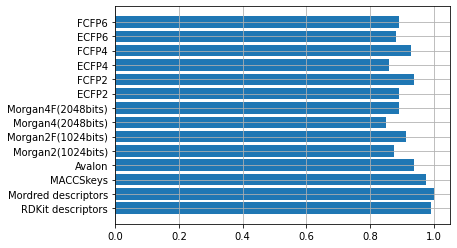

In [ ]:
plt.barh(names4barh, scores4barh)
plt.grid()
plt.show()

(506, 34)
RDKit descriptors best_model GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='exponential', max_depth=30,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=100,
                           n_iter_no_change=None, presort='deprecated',
                           random_state=None, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)


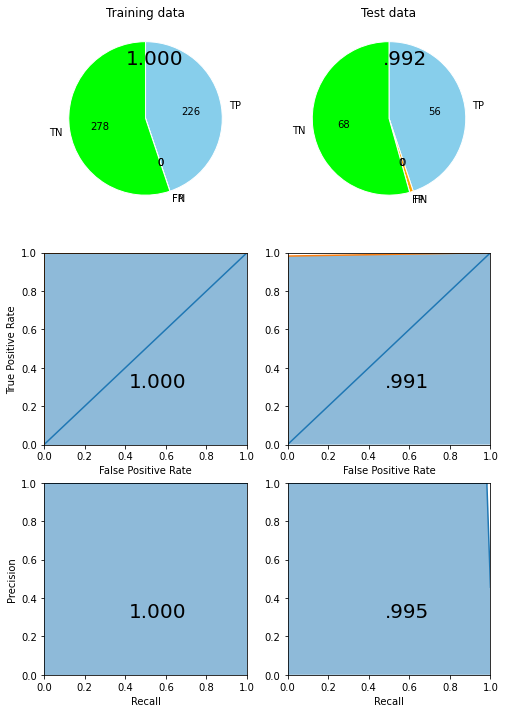

RDKit descriptors stacking_model


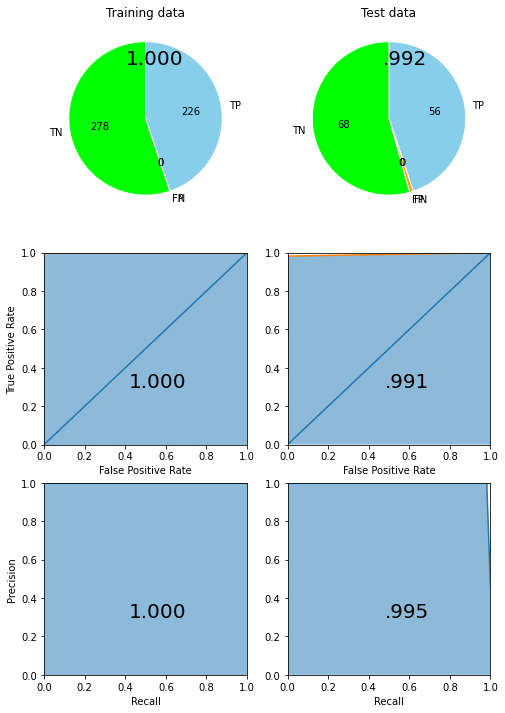

(506, 141)
Mordred descriptors best_model GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='deviance', max_depth=19,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=100,
                           n_iter_no_change=None, presort='deprecated',
                           random_state=None, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)


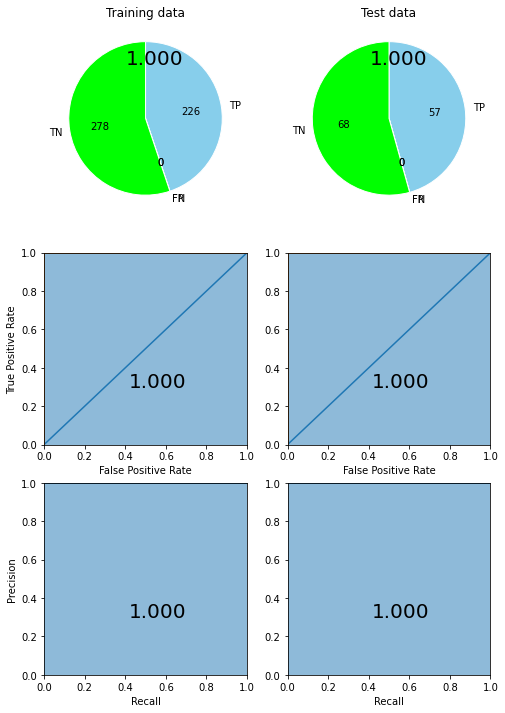

Mordred descriptors stacking_model


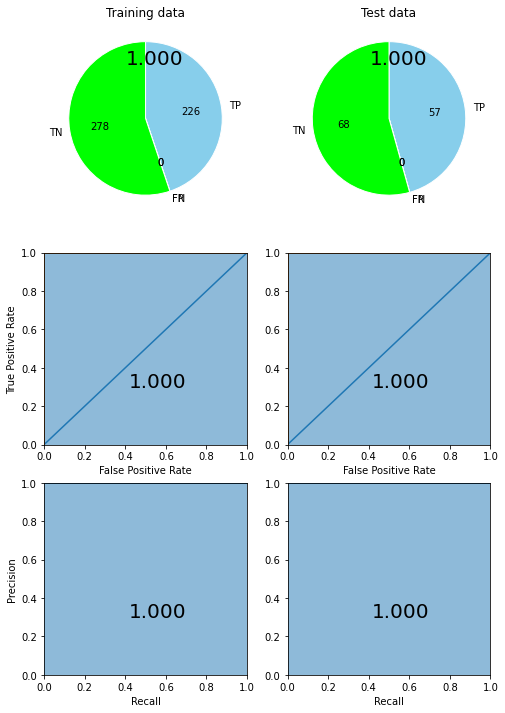

(506, 119)
MACCSkeys best_model SVC(C=452.6055406416081, break_ties=False, cache_size=200, class_weight=None,
    coef0=0.0, decision_function_shape='ovr', degree=3, gamma='auto',
    kernel='linear', max_iter=530000, probability=True, random_state=None,
    shrinking=True, tol=0.001, verbose=False)


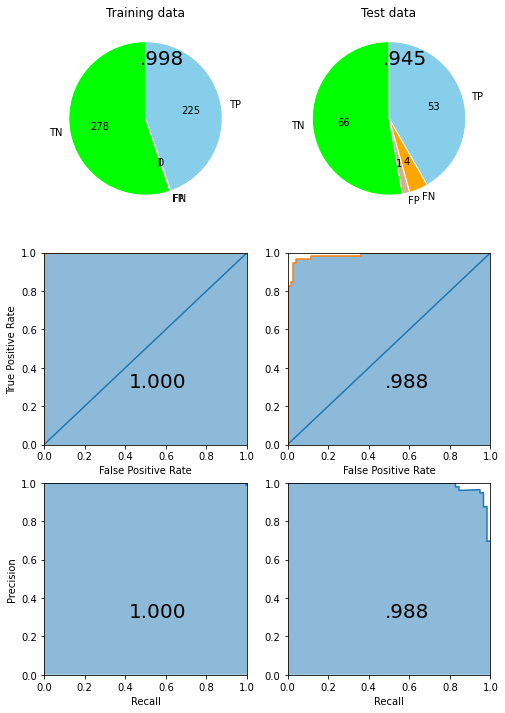

MACCSkeys stacking_model


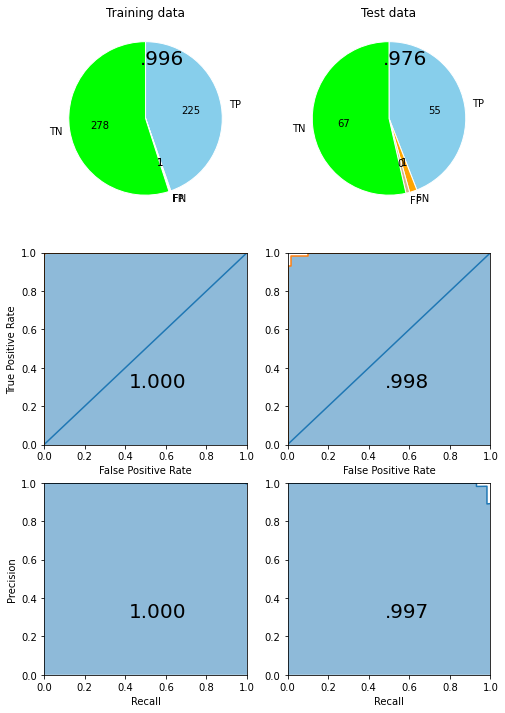

(506, 488)
Avalon best_model SVC(C=4.732226658417242, break_ties=False, cache_size=200, class_weight=None,
    coef0=0.0, decision_function_shape='ovr', degree=3, gamma='auto',
    kernel='linear', max_iter=530000, probability=True, random_state=None,
    shrinking=True, tol=0.001, verbose=False)


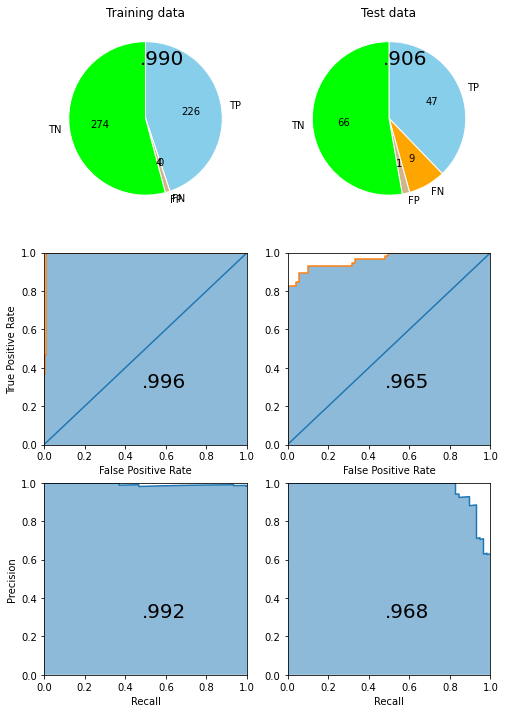

Avalon stacking_model


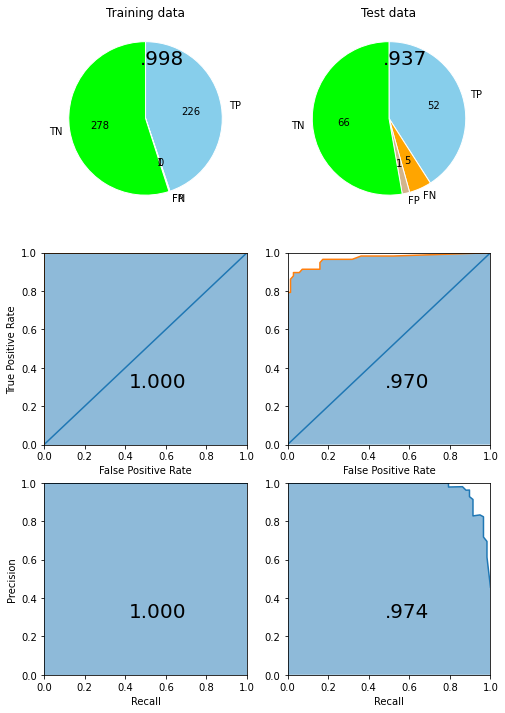

(506, 849)
Morgan2(1024bits) best_model GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='exponential', max_depth=6,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=100,
                           n_iter_no_change=None, presort='deprecated',
                           random_state=None, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)


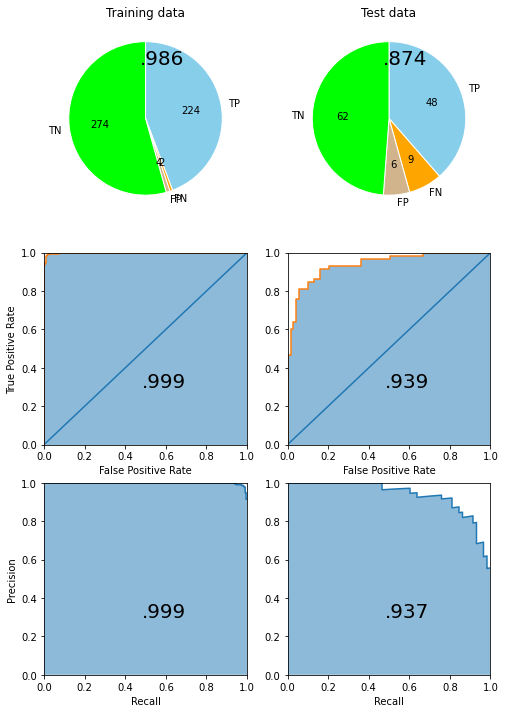

Morgan2(1024bits) stacking_model


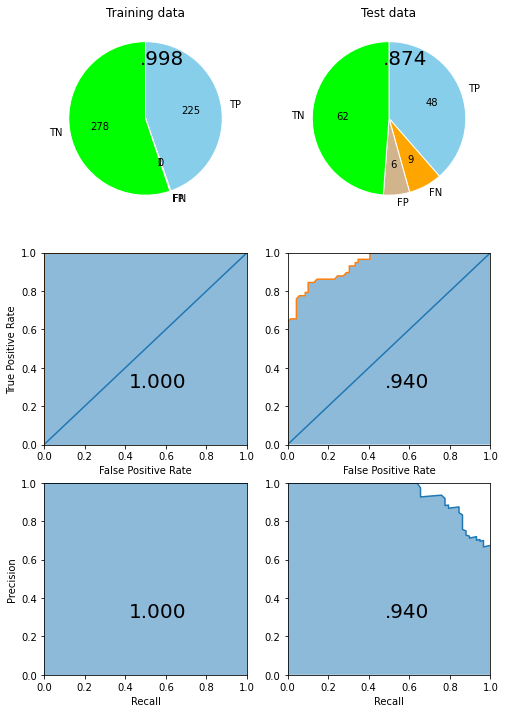

(506, 518)
Morgan2F(1024bits) best_model RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=32, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=False, random_state=None, verbose=0,
                       warm_start=False)


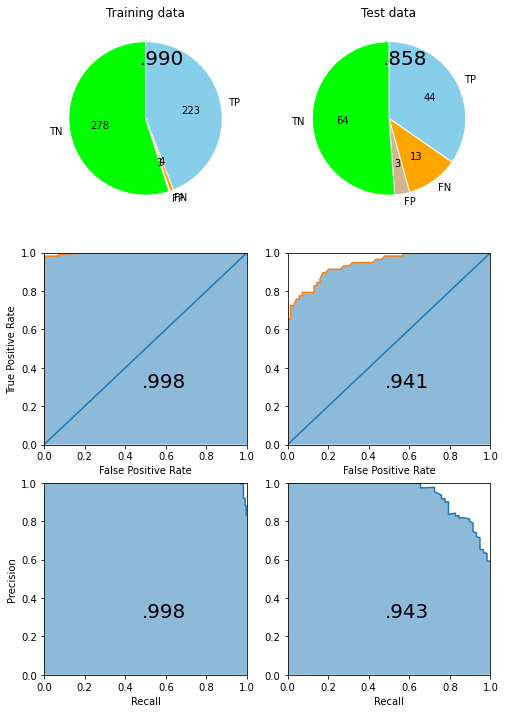

Morgan2F(1024bits) stacking_model


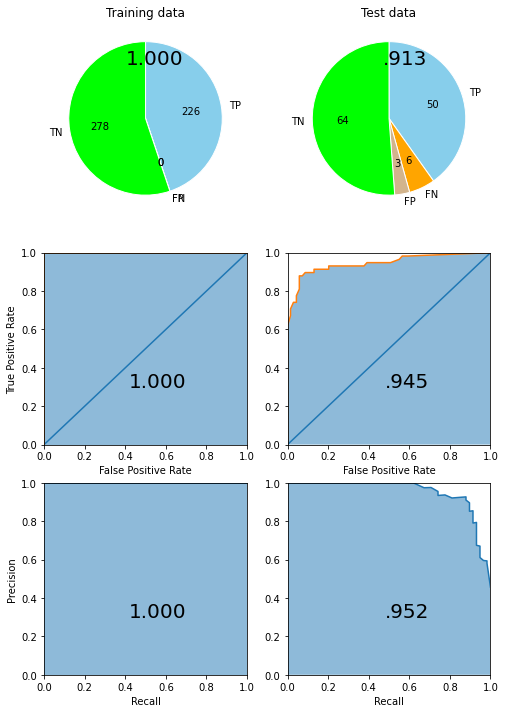

(506, 1518)
Morgan4(2048bits) best_model RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=32, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=False, random_state=None, verbose=0,
                       warm_start=False)


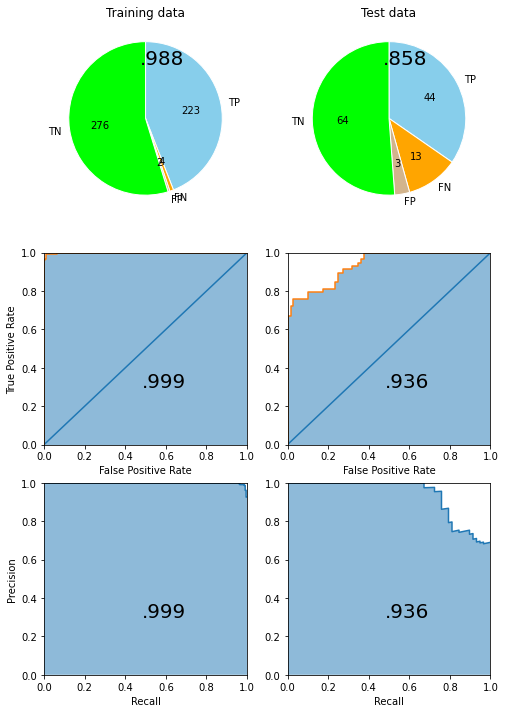

Morgan4(2048bits) stacking_model


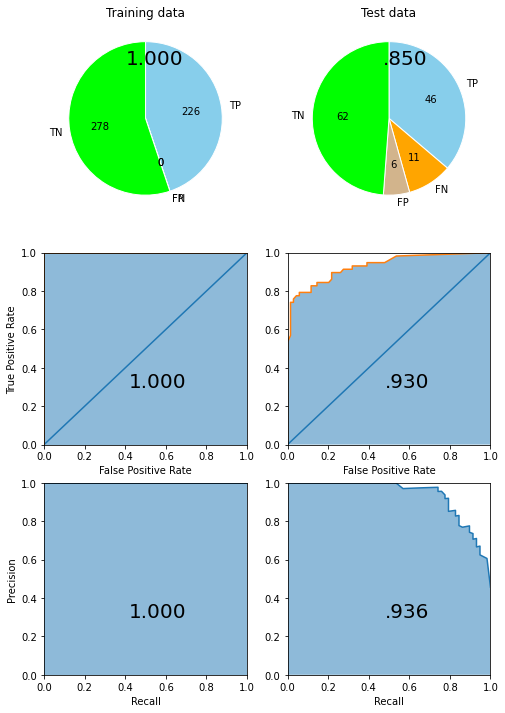

(506, 1303)
Morgan4F(2048bits) best_model RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=28, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=False, random_state=None, verbose=0,
                       warm_start=False)


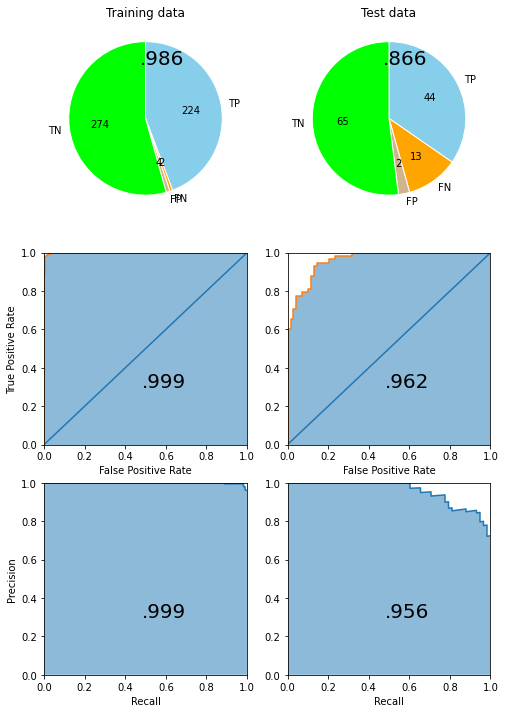

Morgan4F(2048bits) stacking_model


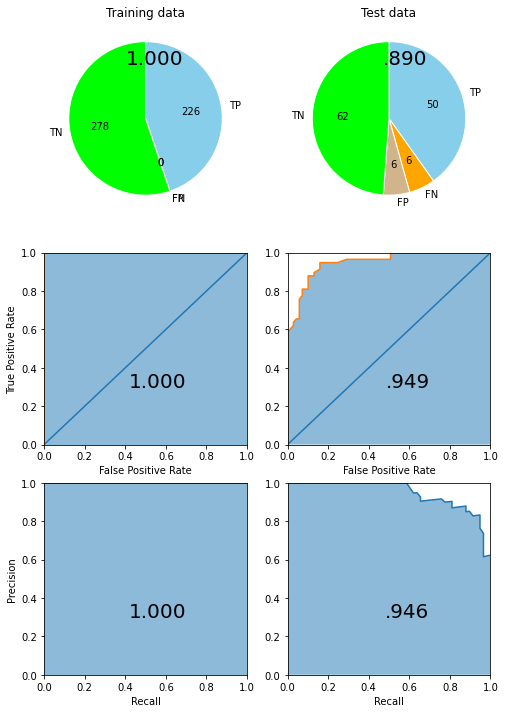

(506, 514)
ECFP2 best_model GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='deviance', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=100,
                           n_iter_no_change=None, presort='deprecated',
                           random_state=None, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)


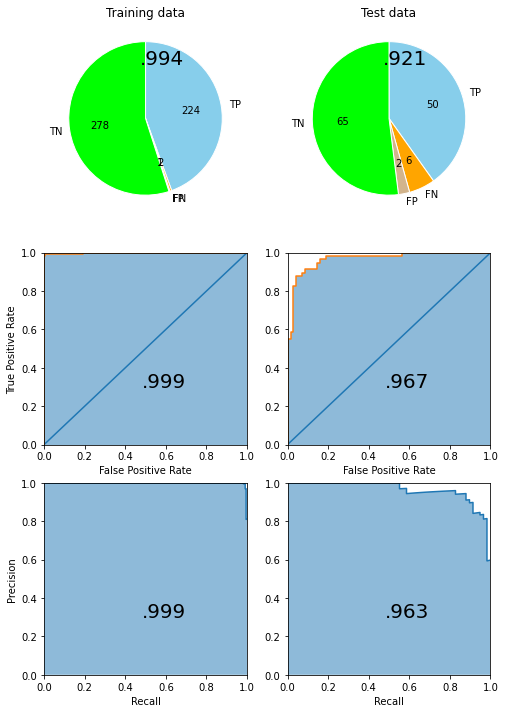

ECFP2 stacking_model


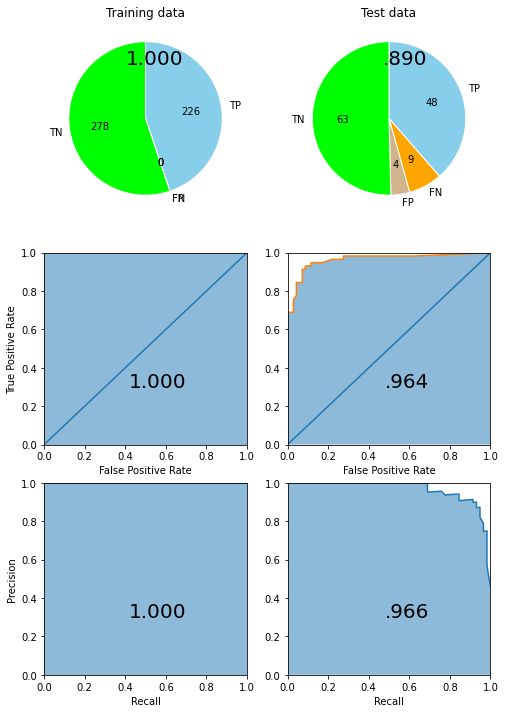

(506, 180)
FCFP2 best_model SVC(C=35531.28517558978, break_ties=False, cache_size=200, class_weight=None,
    coef0=0.0, decision_function_shape='ovr', degree=3, gamma='auto',
    kernel='linear', max_iter=530000, probability=True, random_state=None,
    shrinking=True, tol=0.001, verbose=False)


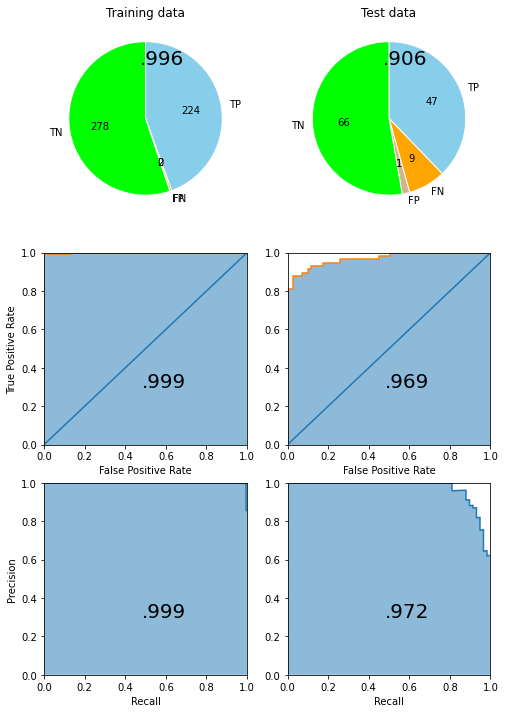

FCFP2 stacking_model


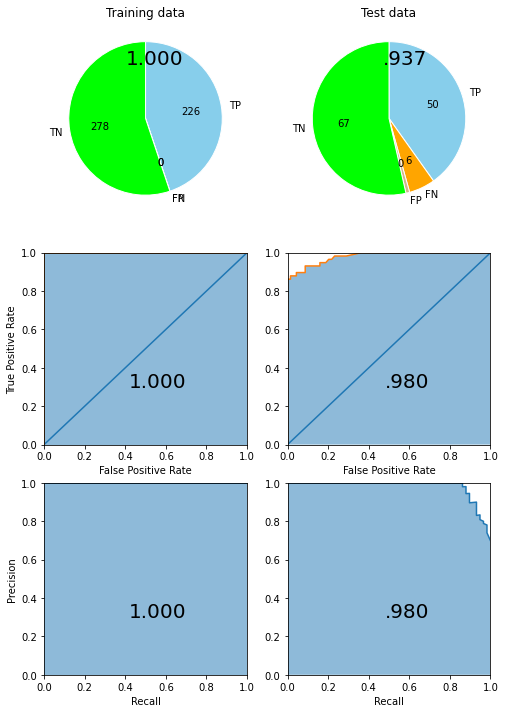

(506, 1795)
ECFP4 best_model RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=18, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=False, random_state=None, verbose=0,
                       warm_start=False)


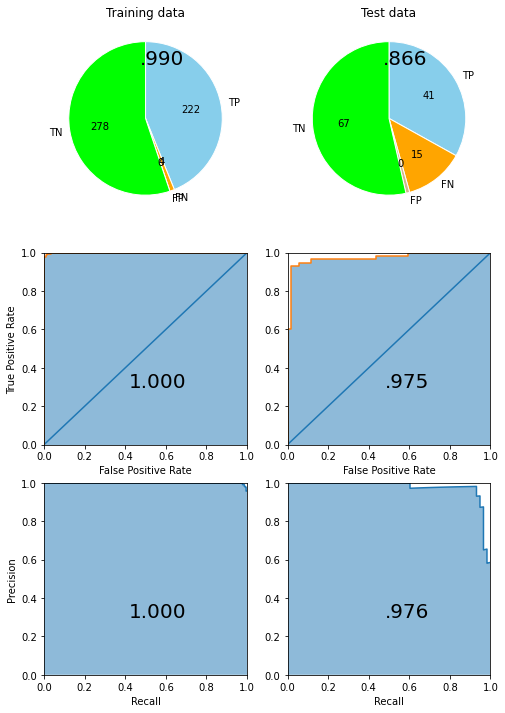

ECFP4 stacking_model


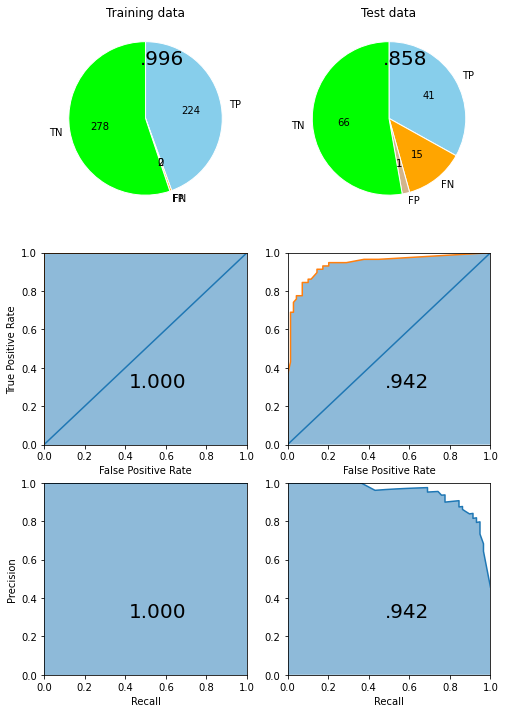

(506, 1030)
FCFP4 best_model GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='deviance', max_depth=2,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=100,
                           n_iter_no_change=None, presort='deprecated',
                           random_state=None, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)


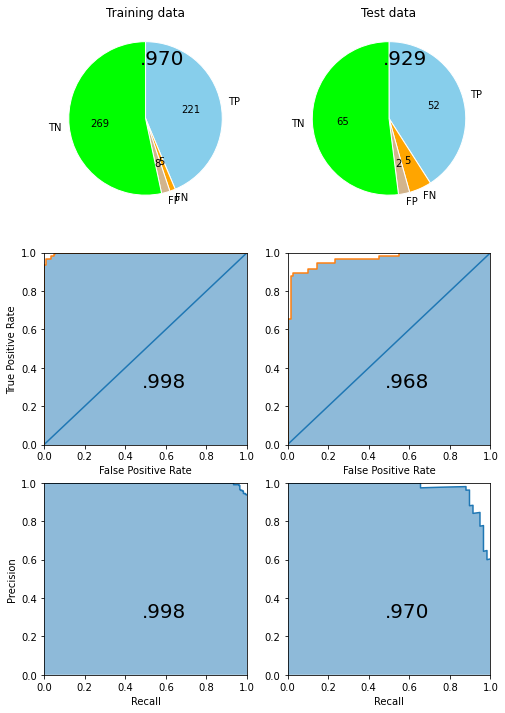

FCFP4 stacking_model


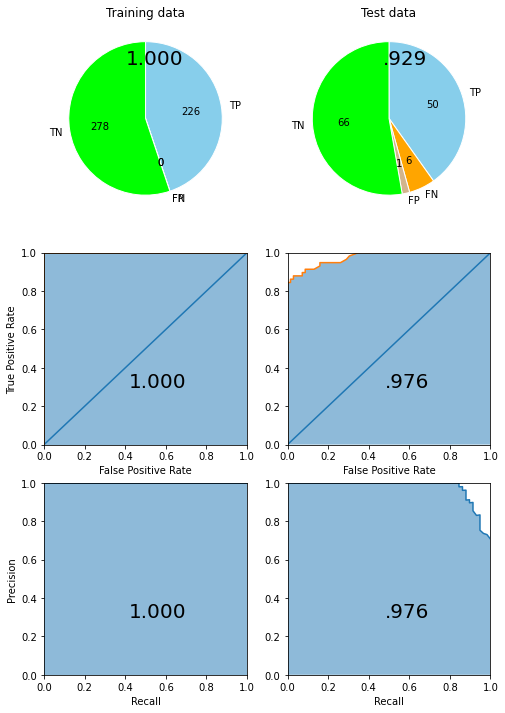

(506, 2872)
ECFP6 best_model RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=25, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=-1, oob_score=False, random_state=None, verbose=0,
                       warm_start=False)


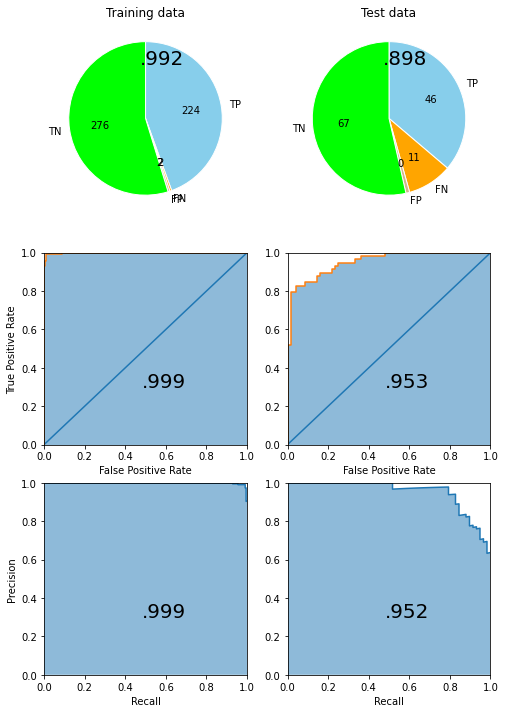

ECFP6 stacking_model


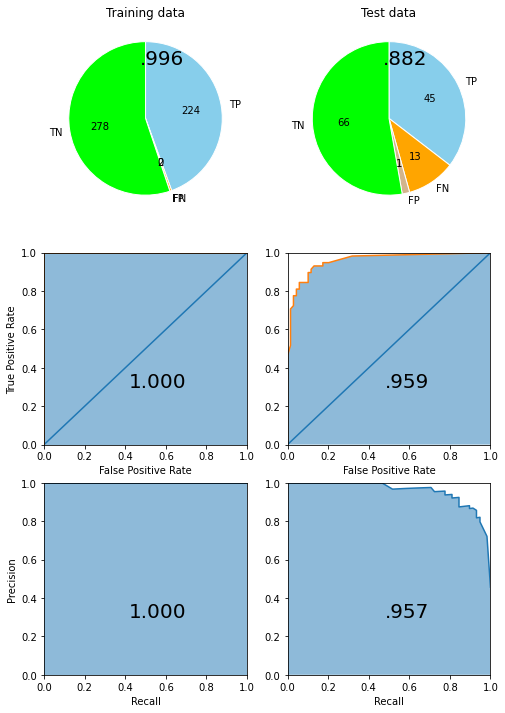

(506, 2173)
FCFP6 best_model SVC(C=10415.935938108281, break_ties=False, cache_size=200, class_weight=None,
    coef0=0.0, decision_function_shape='ovr', degree=3, gamma='auto',
    kernel='rbf', max_iter=530000, probability=True, random_state=None,
    shrinking=True, tol=0.001, verbose=False)


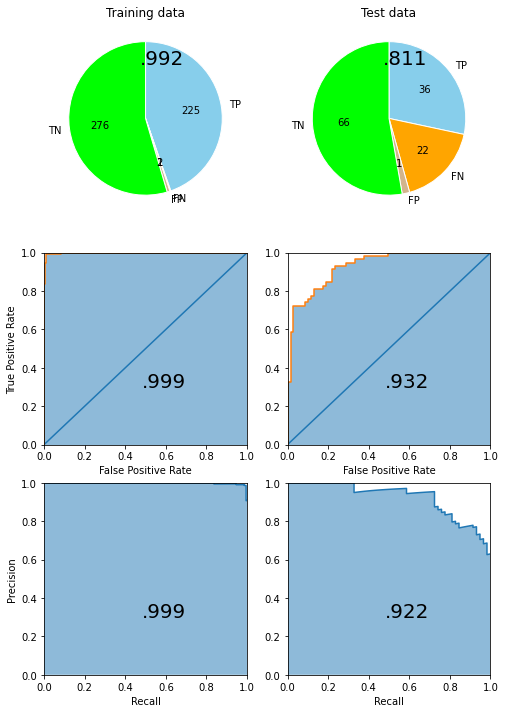

FCFP6 stacking_model


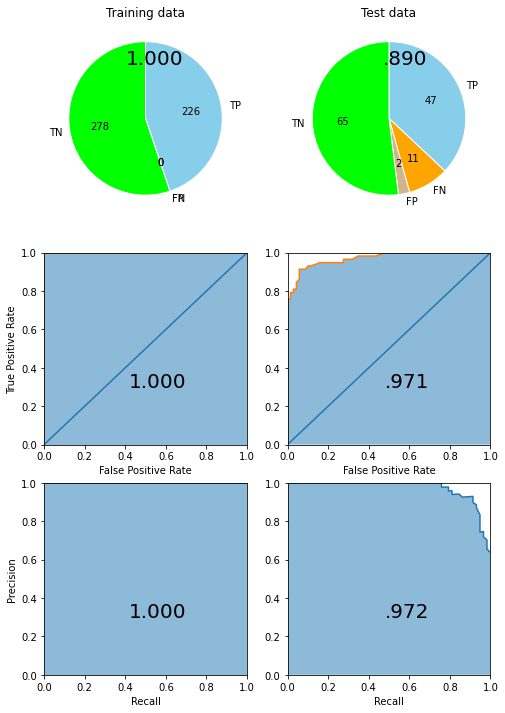

In [49]:
for X_train1, X_test1, objective1, name, pcaumap1, stacking_model1 in zip(
    [X_train_rdkit1, X_train_mordred1] + X_trains1_selected, 
    [X_test_rdkit1, X_test_mordred1] + X_tests1_selected, 
    [objective1_rdkit, objective1_mordred] + objective1s, 
    ["RDKit descriptors", "Mordred descriptors"] + fingerprinter.names(), 
    pcaumap1s,
    stacking_model1s
    ):
    print(X_train1.shape)
    print(name, "best_model", objective1.best_model.model)
    all_sklearn.show_metrics(objective1.best_model.model, X_train1, X_test1, y_train['Molecular refractivity'], y_test['Molecular refractivity'])
    print(name, "stacking_model")
    all_sklearn.show_metrics(stacking_model1, X_train1, X_test1, y_train['Molecular refractivity'], y_test['Molecular refractivity'])

In [ ]:
!date